# Package Imports

In [4]:
import pandas as pd
import numpy as np
#import plotly.express as px
import json
import time
import os
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import QuantileTransformer, StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold, train_test_split
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, r2_score

In [6]:
from ediblepickle import checkpoint
from urllib.parse import quote
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut

In [5]:
# Extra code to show dataframes
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

# Data Importing
Do not assign to imported variables!

### Reloading data directly from pickle

In [8]:
school_neighbors = pd.read_pickle("school_neighbors.pkl")
combined_lr = pd.read_pickle("combined_lr.pkl")
combined_rf = pd.read_pickle("combined_rf.pkl")
modelled_values = combined_rf
school_agg_info = pd.read_pickle("school_agg_info.pkl")
school_agg_features = pd.read_pickle("school_agg_features.pkl")
labels_matrix = pd.read_pickle("labels_matrix.pkl")
features_matrix = pd.read_pickle("features_matrix.pkl")
graduation_feature_importance = pd.read_pickle("graduation_feature_importance.pkl")
college_feature_importance = pd.read_pickle("college_feature_importance.pkl")

### School Information
Information found in this section with the exception of school_cohort are not broken down by demographics. We can merge these dataframes first by the school key. 

In [186]:
data_dir = "Data Files/"

school_cohort = pd.read_table(data_dir + "cohort2021.txt", 
                              dtype={'CountyCode': str, 'DistrictCode': str, 'SchoolCode': str}, 
                              na_values="*"
                              )

school_info = pd.read_table(data_dir + "pubschls.txt", 
                            dtype={'CDSCode': str}, 
                            #usecols = ['CDSCode', 'StatusType', 'Zip', 'Street', 'Latitude', 'Longitude']
                           )

class_sizes = pd.read_csv(data_dir + "acssec.txt",
                          dtype={'CDSCODE': str, 'C': str, 'D': str, 'S': str},
                          usecols= lambda x: not ("Y1" in x or "Y2" in x), #Y1 corresponds to 2018-2019, Y2 corresponds to 2019-2020
                         )

ap_courses = pd.read_csv(data_dir + "ap_crsbycls.txt", 
                         dtype={"DistrictCode": str, "SchoolCode": str})

poverty_index = pd.read_csv(data_dir + "EDGE_SIDE1519_PUBSCHS1819.CSV",
                           dtype={"NCESSCH": str}
                           )

free_reduced_lunch = pd.read_excel(data_dir + "frpm2021.xlsx", 
                                   sheet_name=1, 
                                   header=1, 
                                   dtype={'County Code': str, 'District Code': str, 'School Code': str})

teacher_salary = pd.read_csv(data_dir + "salary.txt" ,
                             dtype={'CDSCode': str, 'C': str, 'D': str, 'S': str}
                            )

### School Demographics
Information found in this section are given by demographics. We should merge these dataframes to a major dataframe after pivoting and merging by both CDSCode and demographic keys. 

In [279]:
data_dir = "Data Files/"

# Disciplinary Action
suspensions = pd.read_csv(data_dir + "susexpsg.txt",
                            dtype={'CDSCode': str, 'C': str, 'D': str, 'S': str}
                           )

absences = pd.read_csv(data_dir + "chronic.txt", 
                       dtype={'CDSCode': str, 'C': str, 'D': str, 'S': str}
                      )

# Test scores
ca_science = pd.read_csv(data_dir + "casci.txt",
                         dtype={'C': str, 'D': str, 'S': str})

ca_english = pd.read_csv(data_dir + "caela.txt",
                         dtype={'C': str, 'D': str, 'S': str})

ca_math = pd.read_csv(data_dir + "camath.txt",
                      dtype={'C': str, 'D': str, 'S': str})

## Data Wrangling: Cleaning Datasets
Tidying up dataframes and creating new key columns for effective merging. 

In [188]:
school_cohort["CDSCode"] = (school_cohort["CountyCode"] + school_cohort["DistrictCode"] + school_cohort["SchoolCode"]).str.strip()
cols = school_cohort.columns
school_cohort = school_cohort[cols[0:1].append(cols[-1:]).append(cols[1:-1])]
# Include percentage of UC/CSU qualified grads as percentage of entire population, not just graduates. 
school_cohort["UC/CSU Grad Req Total Population (Rate)"] = school_cohort["Met UC/CSU Grad Req's (Count)"]/school_cohort["CohortStudents"]*100

# For school_info, create a key to connect national education information 
school_info = school_info
school_info["NCESCode"] = school_info["NCESDist"] + school_info["NCESSchool"]
cols = school_info.columns
school_info = school_info[cols[0:1].append(cols[-1:]).append(cols[1:-1])]

# For class sizes, set NaN = 0 and then recast all counts as ints. 
class_sizes = class_sizes.rename(columns = {"CDSCODE": "CDSCode"})
class_sizes = class_sizes.fillna(0)
cols = ['NCSEN_Y3', 'NCMEN_Y3', 'NCLEN_Y3', 'NCSMA_Y3', 'NCMMA_Y3', 'NCLMA_Y3', 'NCSSC_Y3', 'NCMSC_Y3', 'NCLSC_Y3', 'NCSSS_Y3', 'NCMSS_Y3', 'NCLSS_Y3']
class_sizes[cols] = class_sizes[cols].astype(int)

# For testing information, combine the individual codes to create a CDS code. 
ca_science = ca_science
ca_science["CDSCode"] = ca_science["C"] + ca_science["D"] + ca_science["S"]
cols = ca_science.columns
ca_science = ca_science[cols[-1:].append(cols[0:-1])]

ca_english = ca_english
ca_english["CDSCode"] = ca_english["C"] + ca_english["D"] + ca_english["S"]
cols = ca_english.columns
ca_english = ca_english[cols[-1:].append(cols[0:-1])]

ca_math = ca_math
ca_math["CDSCode"] = ca_math["C"] + ca_math["D"] + ca_math["S"]
cols = ca_math.columns
ca_math = ca_math[cols[-1:].append(cols[0:-1])]

ap_courses = ap_courses.fillna(0)
ap_courses["CDSCode"] = ap_courses["DistrictCode"] + ap_courses["SchoolCode"]
cols = ap_courses.columns
ap_courses = ap_courses[cols[-1:].append(cols[0:-1])]

poverty_index = poverty_index.rename(columns = {"NCESSCH": "NCESCode"})
poverty_index["NCESSchoolCode"] = poverty_index["NCESCode"].str[-5:]
poverty_index = poverty_index[["NCESCode", "NCESSchoolCode", "NAME", "IPR_EST", "IPR_SE"]]

free_reduced_lunch = free_reduced_lunch
free_reduced_lunch["CDSCode"] = free_reduced_lunch["County Code"] + free_reduced_lunch["District Code"] + free_reduced_lunch["School Code"]
cols = free_reduced_lunch.columns
free_reduced_lunch = free_reduced_lunch[cols[-1:].append(cols[0:-1])]

## Data Wranging: Merging
After preliminary data wrangling, we start to join the various databases into a features matrix that is first initialized by taking sections of the school_cohort dataframe. 
The features matrix will be stored as a dataframe called school_features_data

In [189]:
# Select only the data that represents traditional high schools (both charter and non-charter). 
# The returned df will have duplicated values on ReportingCategory 
# which will need to be filtered further along "All" or everything but "All"

school_data = school_cohort.query("AggregateLevel == 'S' & " +
                                  "DASS == 'No ' & " +
                                  "CharterSchool != 'All' &" + 
                                  "SchoolCode != '0000000' & " +
                                  "SchoolCode != '0000001'")
                                
dropped_columns = school_cohort.columns.drop(
                    ["AcademicYear", "AggregateLevel", "CountyCode", "DistrictCode", "SchoolCode", 
                     "CountyName", "DistrictName", "DASS"])
school_data = school_data.dropna()[dropped_columns]
school_data.rename(columns={"Golden State Seal Merit Diploma (Rate": "Golden State Seal Merit Diploma (Rate)"}, 
                   inplace = True)
count_columns = school_data.columns[["Count" in x for x in school_data.columns]]
rate_columns = school_data.columns[["Rate" in x for x in school_data.columns]]
school_data[count_columns] = school_data[count_columns].astype(int)
school_data["CohortStudents"] = school_data["CohortStudents"].astype(int)

In [190]:
# First, select only active schools and filter for relevant information. 
school_info_short = school_info[school_info["GSserved"].str.contains("12")][["School", "CDSCode", "NCESCode", "County", "StatusType", "Street", "Zip", "Magnet", "Latitude", "Longitude"]]
school_info_short["NCESSchoolCode"] = school_info_short["NCESCode"].str[-5:]

# Then, use Nomatim to fill in missing latitude information
geolocator = Nominatim(user_agent="lamdavid759@gmail.com")
missingGeoData = school_info_short.query("Latitude == 'No Data'").index

# Set-up cache for scraping individual results
cache_dir = 'geodata'
if not os.path.exists(cache_dir):
    os.mkdir(cache_dir)
    
@checkpoint(key=lambda args, kwargs: str(args[1]) + '.pkl', work_dir=cache_dir)
def obtain_geodata(df, ind):
    time.sleep(1)
    addy = df.loc[i]["Street"] + ', ' + str(df.loc[i]["Zip"])
    try: 
        location = geolocator.geocode(addy, timeout=None)
    except GeocoderTimedOut as e: 
        print(e.message)
    else: 
        if location: 
            df.at[i, "Latitude"] = location.latitude
            df.at[i, "Longitude"] = location.longitude 

# Iterate through the entries with missing geodata
for i in missingGeoData: 
     obtain_geodata(school_info_short, i)

school_info_short = school_info_short[["School", "CDSCode", "NCESCode", "NCESSchoolCode", "County", "StatusType", "Magnet", "Zip", "Latitude", "Longitude"]]
school_agg_info = school_info_short.set_index("CDSCode").drop("Magnet", axis=1)

In [191]:
school_agg_info.to_pickle("school_agg_info.pkl")

In [192]:
# Now merge the school_data with school_info_short
school_features_data = pd.merge(school_data, school_info_short, on = "CDSCode", how='inner')
count_columns = school_data.columns[["Count" in x for x in school_data.columns]]
rate_columns = school_data.columns[["Rate" in x for x in school_data.columns]]
selected_columns = ["CDSCode", "NCESCode", "NCESSchoolCode", "SchoolName", "Magnet", "CharterSchool", "ReportingCategory", "CohortStudents", "Zip", "Latitude", "Longitude"]
selected_columns.extend(count_columns)
selected_columns.extend(rate_columns)
school_features_data = school_features_data[selected_columns]

In [193]:
# Now merge the school_features_data with class sizes, dropping extra information for the CDS Code and Year. 
school_features_data = pd.merge(school_features_data, class_sizes, on = "CDSCode", how="left").drop(["C", "D", "S", "SARCYear"], axis=1)

# Info about the number of offered AP courses and the percentage of students who take AP courses. 
school_features_data = pd.merge(school_features_data, ap_courses, on = "CDSCode", how="left").drop(["DistrictCode", "SchoolCode", "SARCYear"], axis=1)

In [545]:
# Now merge the school_features_data with poverty index information. 
# Note: 336 schools do not have their NCESCode match because they have changed school districts, so a secondary merge
# on name + NCESSchoolCode (the last 5 digits of the NCES Code) is done then joined to the main data. This reduces the number of unmatched schools
# to 35, and all subsequent data will be set to the average. 
initial_merge = pd.merge(school_features_data, poverty_index, 
                         on=["NCESCode", "NCESSchoolCode"], 
                         how = "left", 
                         indicator=True)
not_joined = initial_merge[initial_merge["_merge"] == "left_only"].drop(["NAME", "IPR_EST", "IPR_SE", "_merge"], axis=1)
joined = initial_merge[initial_merge["_merge"] == "both"].drop(["NAME", "_merge"], axis=1)

secondary_merge = pd.merge(not_joined, poverty_index, 
                           left_on=["NCESSchoolCode", "SchoolName"], right_on=["NCESSchoolCode", "NAME"], 
                           how= "left")
# Here we keep the NCESCode from the poverty index. 
secondary_merge = secondary_merge.drop(["NCESCode_x", "NAME"], axis=1).rename(columns={"NCESCode_y": "NCESCode"})

school_features_data = pd.concat([joined, secondary_merge])
# Fill the NaN values with the average from each school, taking care to filter by TA to only have 1 instance of each school. 
school_features_data["IPR_EST"] = school_features_data["IPR_EST"].fillna(school_features_data.query("ReportingCategory == 'TA'")["IPR_EST"].mean())
school_features_data["IPR_SE"] = school_features_data["IPR_SE"].fillna(school_features_data.query("ReportingCategory == 'TA'")["IPR_SE"].mean())

In [546]:
# Now merge on the free and reduced price meals data on a per school basis. 
rename_cols_dict = {"Free Meal \nCount \n(K-12)": "FM Count", 
                    "Percent (%) \nEligible Free \n(K-12)": "FM Percent", 
                    "FRPM Count \n(K-12)": "FRPM Count", 
                    "Percent (%) \nEligible FRPM \n(K-12)": "FRPM Percent"}
FRPM_data = free_reduced_lunch.rename(columns = rename_cols_dict)
FRPM_data = FRPM_data[["CDSCode", "FM Count", "FM Percent", "FRPM Count", "FRPM Percent"]]                    
FRPM_data[["FM Percent", "FRPM Percent"]] = FRPM_data[["FM Percent", "FRPM Percent"]] * 100
school_features_data = pd.merge(school_features_data, FRPM_data, on= "CDSCode", how="left")

In [547]:
# Merge teacher salary data

teach_sal_data = teacher_salary.drop(["C", "D", "S", "SARCYear"], axis=1)
teach_sal_data = teach_sal_data.drop([col for col in teach_sal_data.columns if "AVG" in col or "AVE" in col], axis=1)
teach_sal_data = teach_sal_data.drop(["PRSAL", "PRSALM"], axis=1)

# For those values that are not represented in the merge, set it to the Californian provided in the original teacher_salary df
school_features_data = pd.merge(school_features_data, teach_sal_data, on="CDSCode", how="left")
school_features_data["BTEACHSAL"] = school_features_data["BTEACHSAL"].fillna(teacher_salary["AVEBTCHSAL"].iloc[0])
school_features_data["MTCHSAL"] = school_features_data["MTCHSAL"].fillna(teacher_salary["AVGMTCHSAL"].iloc[0])
school_features_data["HTCHSAL"] = school_features_data["HTCHSAL"].fillna(teacher_salary["AVGHTCHSAL"].iloc[0])
school_features_data["PRSALH"] = school_features_data["PRSALH"].fillna(teacher_salary["AVGPRSALH"].iloc[0])
school_features_data["SUPSAL"] = school_features_data["SUPSAL"].fillna(teacher_salary["AVGSUPSAL"].iloc[0])
school_features_data["PTCHSAL"] = school_features_data["PTCHSAL"].fillna(teacher_salary["AVGPTCHSAL"].iloc[0])
school_features_data["PADMSAL"] = school_features_data["PADMSAL"].fillna(teacher_salary["AVGPADMSAL"].iloc[0])

# School-Level Analysis
At this point, we need to decide between analyzing on a school level or provide additional granularity via the ReportingCategory Series before subsequent merging. As a first pass, let's look at the school level data with the modification that we pivot the ReportingCategory and CohortStudents field to provide some school-level demographic data. 

### Preparing the features matrix for school-level analysis. 

In [548]:
# Querying for school-level data and then doing some manipulations to get demographic information on the same entry as the school. 
school_agg_data = school_features_data.query("ReportingCategory == 'TA'").set_index("CDSCode")

demographic_data = school_features_data.query("ReportingCategory != 'TA'")[["CDSCode", "ReportingCategory", "CohortStudents"]]
demographic_data = demographic_data.pivot(index="CDSCode", columns="ReportingCategory", values="CohortStudents")

school_agg_data = pd.merge(school_agg_data, demographic_data, left_index=True, right_index=True, how="left").fillna(0)

In [549]:
# To improve signal to noise, exclude high schools with less than 30 students (which can be justified by taking 3*minimum reporting numbers for CA DoE. Further
# remove all alternative schools that did not report as a DASS school. 
filtered_school_agg_data = school_agg_data[school_agg_data["CohortStudents"] > 30]
filtered_school_agg_data = filtered_school_agg_data[~filtered_school_agg_data["SchoolName"].str.contains("Alternative")] 

In [550]:
possible_features = [col for col in filtered_school_agg_data.columns if "(Rate)" not in col and "(Count)" not in col]
possible_features_col = ["Magnet", "CharterSchool", "CohortStudents"] + possible_features[-17:] + possible_features[10:-17] # "Latitude", "Longitude", 

school_agg_features = filtered_school_agg_data[possible_features_col].copy()

# Feature engineering to normalize features in a given set against appropriate numbers (e.g. number of classrooms with certain attribute divided by number of classrooms)

# Normalize demographics with total student population after doing some manipulation on the male/female columns.
demographic_cols = ["GF", "GM", "RA", "RB", "RD", "RF", "RH", "RI", "RP", "RT", "RW", "SD", "SE", "SF", "SH", "SM", "SS"]
school_agg_features.loc[:, demographic_cols] = school_agg_features.loc[:, demographic_cols].divide(school_agg_features.loc[:, "CohortStudents"], axis = 'index')*100

# Normalize classroom numbers with total number of classes
english_cols = ["NCSEN_Y3", "NCMEN_Y3", "NCLEN_Y3"]
total_english_classes = (school_agg_features.loc[:, english_cols]).sum(axis=1).replace(0, 1) # If there are 0 classes, we wish to divide by 1 to avoid any Division by Zero errors. 
school_agg_features.loc[:, english_cols] = (school_agg_features.loc[:, english_cols]).divide(total_english_classes, axis=0)*100

math_cols = ["NCSMA_Y3", "NCMMA_Y3", "NCLMA_Y3"]
total_math_classes = (school_agg_features.loc[:, math_cols]).sum(axis=1).replace(0, 1) # If there are 0 classes, we wish to divide by 1 to avoid any Division by Zero errors. 
school_agg_features.loc[:, math_cols] = (school_agg_features.loc[:, math_cols]).divide(total_math_classes, axis=0)*100

science_cols = ["NCSSC_Y3", "NCMSC_Y3", "NCLSC_Y3"]
total_science_classes = (school_agg_features.loc[:, science_cols]).sum(axis=1).replace(0, 1) # If there are 0 classes, we wish to divide by 1 to avoid any Division by Zero errors. 
school_agg_features.loc[:, science_cols] = (school_agg_features.loc[:, science_cols]).divide(total_science_classes, axis=0)*100

social_cols = ["NCSSS_Y3", "NCMSS_Y3", "NCLSS_Y3"]
total_social_classes = (school_agg_features.loc[:, social_cols]).sum(axis=1).replace(0, 1) # If there are 0 classes, we wish to divide by 1 to avoid any Division by Zero errors. 
school_agg_features.loc[:, social_cols] = (school_agg_features.loc[:, social_cols]).divide(total_social_classes, axis=0)*100

# Manually map the status of a magnet school to 1 or 0. 
school_agg_features["Magnet"] = school_agg_features["Magnet"].map({"Y": 1, "N": 0})

# Manually map the status of a charter school to 1 or 0. 
school_agg_features["CharterSchool"] = school_agg_features["CharterSchool"].map({"Yes": 1, "No ": 0})

# Rename the dataframe to more understandable Series names. 
rename_dict = {"CharterSchool": "Charter", "CohortStudents": "NumStudents", "GF": "PercentFemale", "GM": "PercentMale", "RA": "PercentAsian", "RB": "PercentAfricanAm", 
               "RD": "PercentNotReported", "RF": "PercentFilipino", "RH": "PercentHispanic", "RI": "PercentAmIndian", "RP": "PercentPacificIslander", "RT": "PercentTwo+Races", 
               "RW": "PercentWhite", "SD": "PercentDisabilities", "SE": "PercentESL", "SF": "PercentFoster", "SH": "PercentHomeless", "SM": "PercentMigrant", "SS": "PercentSED", 
               "AVGEN_Y3": "AvgEnglishSize", "NCSEN_Y3": "PercentEnglish-Small", "NCMEN_Y3": "PercentEnglish-Medium", "NCLEN_Y3": "PercentEnglish-Large",
               "AVGMA_Y3": "AvgMathSize", "NCSMA_Y3": "PercentMath-Small", "NCMMA_Y3": "PercentMath-Medium", "NCLMA_Y3": "PercentMath-Large",
               "AVGSC_Y3": "AvgScienceSize", "NCSSC_Y3": "PercentScience-Small", "NCMSC_Y3": "PercentScience-Medium", "NCLSC_Y3": "PercentScience-Large",
               "AVGSS_Y3": "AvgSocialSize", "NCSSS_Y3": "PercentSocial-Small", "NCMSS_Y3": "PercentSocial-Medium", "NCLSS_Y3": "PercentSocial-Large",
               "CSNAPC": "Num_AP_CS", "ENAPC": "Num_AP_Eng", "FPANAPC": "Num_AP_FineArts", "FLNAPC": "Num_AP_Foreign", "MNAPC": "Num_AP_Math", "SNAPC": "Num_AP_Science", 
               "SSNAPC": "Num_AP_Social", "ALLNAPC": "Num_AP_Total", "PSIAPC": "Percent_Students_AP", 
               "IPR_EST": "Poverty_Index", "IPR_SE": "Poverty_Index_SE", 
               "FM Count": "NumFreeMeals", "FM Percent": "PercentFreeMeals", "FRPM Count": "NumFreeReduced", "FRPM Percent": "PercentFreeReduced", 
               "BTEACHSAL": "Beginning_ Salary", "MTCHSAL": "Mid-Range_Salary", "HTCHSAL": "Highest_Salary", 
               "PRSALH": "Principal_Salary", "SUPSAL": "Superintendent_Salary", "PTCHSAL": "Percent_Teacher_Salary", "PADMSAL": "Percent_Admin_Salary"}

school_agg_features = school_agg_features.rename(columns=rename_dict)

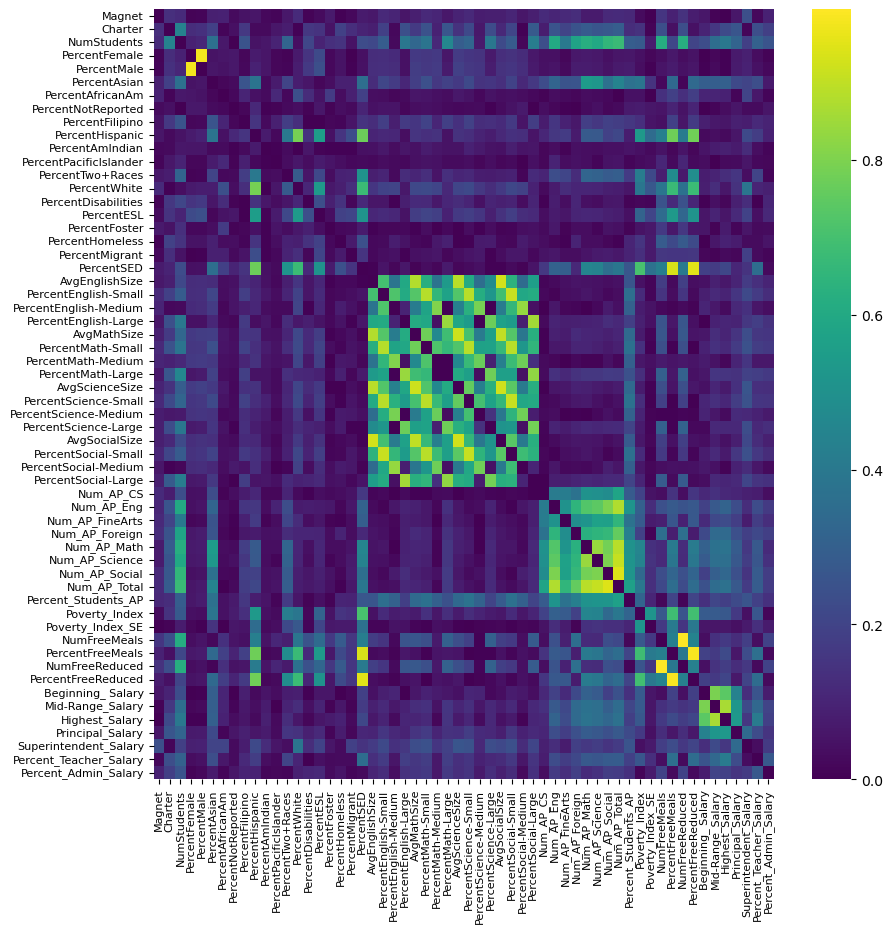

In [281]:
# Check correlations between existing values to remove highly correlated features. 
correlations = school_agg_features.corr()
sns.heatmap(np.abs(correlations).replace(1,0), cmap='viridis', xticklabels=True, yticklabels=True)
plt.gcf().set_size_inches(10, 10)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8);

In [551]:
# Using information from correlations and domain knowledge, select the appropriate features and labels. 
features = ['Magnet', 'Charter', 'NumStudents', 'PercentFemale', 'PercentAsian', 'PercentAfricanAm', 'PercentFilipino', 'PercentHispanic', 'PercentAmIndian', 'PercentPacificIslander', 
            'PercentTwo+Races', 'PercentWhite', 'PercentDisabilities', 'PercentESL', 'PercentFoster', 'PercentHomeless', 'PercentMigrant', 'PercentSED',
            'AvgMathSize', 'PercentMath-Small', 'PercentMath-Medium', 'PercentMath-Large', 'Num_AP_CS', 'Num_AP_Eng', 'Num_AP_FineArts',
            'Num_AP_Foreign', 'Num_AP_Math', 'Num_AP_Science', 'Num_AP_Social', 'Num_AP_Total', 'Percent_Students_AP', 
            'Poverty_Index', 'Poverty_Index_SE', 'NumFreeReduced',  'Mid-Range_Salary', 'Principal_Salary','Superintendent_Salary', 'Percent_Teacher_Salary', 'Percent_Admin_Salary']
            # 'Beginning_ Salary','Highest_Salary', 
            # 'PercentEnglish-Medium', 'PercentEnglish-Large', 'PercentScience-Medium', 'PercentScience-Large','PercentSocial-Medium', 'PercentSocial-Large', 
features_matrix = school_agg_features[features]

labels = ["Regular HS Diploma Graduates (Rate)", "UC/CSU Grad Req Total Population (Rate)", "Dropout (Rate)"]
labels_matrix = filtered_school_agg_data[labels]

In [552]:
school_agg_features.to_pickle("school_agg_features.pkl")
features_matrix.to_pickle("features_matrix.pkl")
labels_matrix.to_pickle("labels_matrix.pkl")

## Linear Regression 

### Linear Regression on Graduation Rates

In [292]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV, KFold

pipe_graduation = Pipeline([("scaler", QuantileTransformer(n_quantiles=features_matrix.shape[0]//10)), 
                             ("ridge", Ridge())])


param_grid = {"ridge__alpha": np.linspace(1, 10, 91)}

label = labels_matrix[["Regular HS Diploma Graduates (Rate)"]]

gs = GridSearchCV(pipe_graduation, 
              param_grid, 
              cv = KFold(n_splits = 5, shuffle=True),
              n_jobs = -2)
gs.fit(features_matrix, label)
y_predicted = gs.predict(features_matrix)
gs.score(features_matrix, label)

0.292372197122864

In [294]:
pd.DataFrame(gs.cv_results_).sort_values("rank_test_score");

In [295]:
residual = pd.DataFrame(labels_matrix["Regular HS Diploma Graduates (Rate)"]).rename(columns={"Regular HS Diploma Graduates (Rate)": "Actual"})
residual["Predicted"] = y_predicted
residual["Residual"] = residual["Actual"] - residual["Predicted"]

pd.DataFrame(gs.cv_results_).sort_values("rank_test_score");

graduation_rates_lr = pd.merge(school_features_data.set_index("CDSCode").query("ReportingCategory == 'TA'")[["SchoolName", "CohortStudents", "Latitude", "Longitude"]], residual, 
                               left_index = True, right_index= True)
graduation_rates_lr["Student-Weighted Residual"] = graduation_rates_lr["Residual"] * graduation_rates_lr["CohortStudents"]/100

In [296]:
graduation_rates_lr.sort_values("Residual").sort_values("Student-Weighted Residual")

,SchoolName,CohortStudents,Latitude,Longitude,Actual,Predicted,Residual,Student-Weighted Residual
CDSCode,,,,,,,,
19647251995570,Educational Partnership High,603,33.788846,-118.19499,47.8,70.074896,-22.274896,-134.317623
30664640106765,California Connections Academy Southern Califo...,676,33.476809,-117.67191,75.1,91.997628,-16.897628,-114.227966
37684113731502,San Ysidro High,704,32.566438,-117.01748,76.6,91.234220,-14.634220,-103.024905
19647330118588,Alain Leroy Locke College Preparatory Academy,366,33.934867,-118.26893,54.1,79.547201,-25.447201,-93.136757
01612590125161,Castlemont High,229,37.759536,-122.16291,45.4,79.164565,-33.764565,-77.320854
...,...,...,...,...,...,...,...,...
07617880735407,Pittsburg Senior High,841,38.019548,-121.88137,90.1,84.568808,5.531192,46.517326
30664313033057,Katella High,631,33.825391,-117.88549,96.2,88.825550,7.374450,46.532781
19651281931302,California High,591,33.943816,-118.02427,96.4,88.303662,8.096338,47.849357


In [297]:
coefficients_graduation = [[vals[0], float(vals[1][0]), float(np.abs(vals[1][0]))] for vals in zip(features_matrix.columns, gs.best_estimator_.named_steps['ridge'].coef_.transpose())]

graduation_feature_importance = (pd.DataFrame(coefficients_graduation)
                               .rename(columns={0: "Feature", 2: "Abs Coefficient", 1: "Coefficient"})
                               .sort_values("Abs Coefficient", ascending=False))

In [298]:
graduation_feature_importance

,Feature,Coefficient,Abs Coefficient
17,PercentSED,-8.572669,8.572669
18,AvgMathSize,7.295050,7.295050
13,PercentESL,-6.090578,6.090578
30,Percent_Students_AP,5.422517,5.422517
14,PercentFoster,-5.338923,5.338923
20,PercentMath-Medium,5.169883,5.169883
33,NumFreeReduced,4.437712,4.437712
19,PercentMath-Small,3.066285,3.066285
31,Poverty_Index,-3.036514,3.036514
9,PercentPacificIslander,-2.937805,2.937805


### Linear Regression on College Readiness

In [299]:
pipe_college = Pipeline([("scaler", QuantileTransformer(n_quantiles=features_matrix.shape[0]//10)), 
                         ("ridge", Ridge())])
param_grid = {"ridge__alpha": np.logspace(-4, 3, 22)}
gs_college = GridSearchCV(pipe_college, 
                          param_grid, 
                          cv = KFold(n_splits = 5, shuffle=True),
                          n_jobs = -2)
label_college = labels_matrix[['UC/CSU Grad Req Total Population (Rate)']]

X_train, X_test, y_train, y_test = train_test_split(features_matrix, label_college, train_size=0.2)

gs_college.fit(features_matrix, label_college)
y_college_predicted = gs_college.predict(features_matrix)
gs_college.score(features_matrix, label_college)

0.5370719973976947

In [92]:
pipe_college = Pipeline([("scaler", QuantileTransformer(n_quantiles=features_matrix.shape[0]//10)), 
                         ("ridge", Ridge())])
param_grid = {"ridge__alpha": np.linspace(1, 4, 31)}
gs_college = GridSearchCV(pipe_college, 
                          param_grid, 
                          cv = KFold(n_splits = 5, shuffle=True),
                          n_jobs = -2)
label_college = labels_matrix[['UC/CSU Grad Req Total Population (Rate)']]

X_train, X_test, y_train, y_test = train_test_split(features_matrix, label_college, train_size=0.8)

In [93]:
gs_college.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             estimator=Pipeline(steps=[('scaler',
                                        QuantileTransformer(n_quantiles=144)),
                                       ('ridge', Ridge())]),
             n_jobs=-2,
             param_grid={'ridge__alpha': array([1. , 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2,
       2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5,
       3.6, 3.7, 3.8, 3.9, 4. ])})

In [94]:
pd.DataFrame(gs_college.cv_results_).sort_values("rank_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_ridge__alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
5,0.047686,0.006783,0.017316,0.005332,1.5,{'ridge__alpha': 1.5},0.479672,0.482828,0.550352,0.568155,0.471645,0.510530,0.040344,1
4,0.058996,0.019789,0.014405,0.006829,1.4,{'ridge__alpha': 1.4},0.479625,0.482858,0.550506,0.568381,0.471277,0.510529,0.040513,2
6,0.054202,0.011956,0.020405,0.006538,1.6,{'ridge__alpha': 1.6},0.479715,0.482788,0.550195,0.567927,0.471991,0.510523,0.040180,3
3,0.055601,0.000491,0.019999,0.021522,1.3,{'ridge__alpha': 1.3},0.479573,0.482875,0.550658,0.568605,0.470886,0.510520,0.040688,4
7,0.054602,0.005160,0.015460,0.007489,1.7,{'ridge__alpha': 1.7000000000000002},0.479752,0.482739,0.550035,0.567697,0.472315,0.510508,0.040022,5
2,0.058338,0.005232,0.016389,0.009801,1.2,{'ridge__alpha': 1.2},0.479517,0.482879,0.550806,0.568827,0.470471,0.510500,0.040870,6
8,0.054398,0.013506,0.017192,0.004759,1.8,{'ridge__alpha': 1.8},0.479786,0.482681,0.549874,0.567466,0.472621,0.510486,0.039869,7
1,0.052760,0.003940,0.017798,0.004530,1.1,{'ridge__alpha': 1.1},0.479455,0.482867,0.550951,0.569046,0.470029,0.510470,0.041059,8
9,0.055607,0.004680,0.012145,0.003246,1.9,{'ridge__alpha': 1.9},0.479816,0.482617,0.549711,0.567234,0.472907,0.510457,0.039720,9
0,0.048798,0.000747,0.029530,0.005370,1.0,{'ridge__alpha': 1.0},0.479388,0.482836,0.551092,0.569261,0.469561,0.510428,0.041255,10


In [96]:
gs_college.score(X_train, y_train)

0.5447401958922082

In [98]:
gs_college.score(X_test, y_test)

0.5035443510922335

In [99]:
gs_college.score(features_matrix, label_college)

0.5361820246518596

In [300]:
pd.DataFrame(gs_college.cv_results_).sort_values("rank_test_score");

In [100]:
y_college_predicted = gs_college.predict(features_matrix)

In [301]:
residual_college = pd.DataFrame(labels_matrix["UC/CSU Grad Req Total Population (Rate)"]).rename(columns={"UC/CSU Grad Req Total Population (Rate)": "Actual"})
residual_college["Predicted"] = y_college_predicted
residual_college["Residual"] = residual_college["Actual"] - residual_college["Predicted"]

In [305]:
college_lr = pd.merge(school_features_data.set_index("CDSCode").query("ReportingCategory == 'TA'")[["SchoolName", "CohortStudents", "Latitude", "Longitude"]], residual_college, 
                      left_index = True, right_index= True)
college_lr["Student-Weighted Residual"] = college_lr["Residual"] * college_lr["CohortStudents"]/100

In [306]:
coefficients_college = [[vals[0], float(vals[1][0]), float(np.abs(vals[1][0]))] for vals in zip(features_matrix.columns, gs_college.best_estimator_.named_steps['ridge'].coef_.transpose())]

college_feature_importance = (pd.DataFrame(coefficients_college)
                               .rename(columns={0: "Feature", 2: "Abs Coefficient", 1: "Coefficient"})
                               .sort_values("Abs Coefficient", ascending=False))

In [307]:
college_feature_importance

,Feature,Coefficient,Abs Coefficient
30,Percent_Students_AP,30.985185,30.985185
18,AvgMathSize,23.798522,23.798522
17,PercentSED,-19.686239,19.686239
11,PercentWhite,-18.283284,18.283284
36,Superintendent_Salary,13.641306,13.641306
20,PercentMath-Medium,10.761457,10.761457
7,PercentHispanic,10.298370,10.298370
29,Num_AP_Total,9.876362,9.876362
21,PercentMath-Large,-9.531201,9.531201
2,NumStudents,9.023820,9.023820


In [138]:
college_feature_importance

,Feature,Coefficient,Abs Coefficient
29,Percent_Students_AP,33.200069,33.200069
17,AvgMathSize,26.469674,26.469674
16,PercentSED,-21.316476,21.316476
10,PercentWhite,-18.971085,18.971085
35,Superintendent_Salary,14.846894,14.846894
20,PercentMath-Large,-11.936715,11.936715
6,PercentHispanic,10.666850,10.666850
28,Num_AP_Total,10.581316,10.581316
19,PercentMath-Medium,9.915362,9.915362
12,PercentESL,-9.872205,9.872205


In [308]:
combined_lr = graduation_rates_lr.merge(college_lr[["Actual", "Predicted", "Residual", "Student-Weighted Residual"]], left_index=True, right_index=True, how='left', suffixes = (' Graduation', ' College'))
combined_lr.to_pickle("combined_lr.pkl")

## Nearest Neighbors Schools

### Dimensionality Reduction

In [183]:
# First scale the features prior to PCA and clustering
quantile_scaler = QuantileTransformer(n_quantiles=features_matrix.shape[0]//10)
q_scaled_school_features = pd.DataFrame(quantile_scaler.fit_transform(school_agg_features), columns = school_agg_features.columns, index = school_agg_features.index)

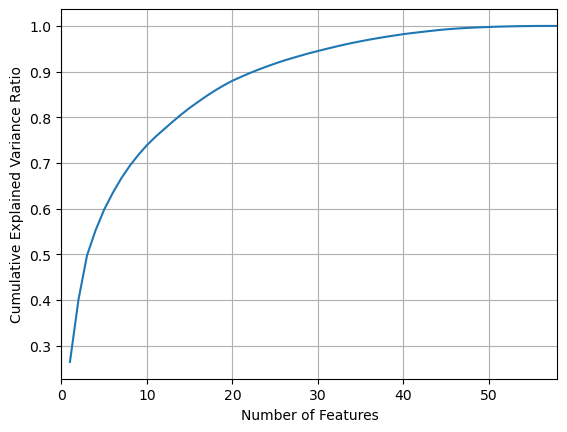

In [185]:
pca_full = PCA(n_components=q_scaled_school_features.shape[1])
schools_pca_transformed = pca_full.fit_transform(q_scaled_school_features)

plt.plot(range(1, school_agg_features.shape[1]+1), pca_full.explained_variance_ratio_.cumsum())
plt.ylabel("Cumulative Explained Variance Ratio")
plt.xlabel("Number of Features")
plt.xlim([0, q_scaled_school_features.shape[1]])
plt.grid()

In [186]:
n = 22
pca_full.explained_variance_ratio_.cumsum()[n-1]

0.8965425640635007

In [187]:
# From a quick analysis of the cumulative explained variance ratio, we see n = 14 explains 80% of the data and n = 22 explains 90% of the data. Let's go with n = 22 to try to create clusters. 
pca = PCA(n_components=22)
schools_reduced_D = pca.fit_transform(q_scaled_school_features)

### Nearest Neighbors

In [318]:
nn = NearestNeighbors(n_neighbors=schools_reduced_D.shape[0])
nn.fit(schools_reduced_D)

distances, indices = nn.kneighbors(schools_reduced_D)

school_codes = []
nearest_neighbors = []
neighbors_codes = []
for vals in indices: 
    school_codes.append(combined_lr.iloc[vals[0]].name)
    neighbors_code = []
    neighbors = []
    for ind in vals:
        neighbors_code.append(combined_lr.iloc[ind].name)
        neighbors.append(combined_lr.iloc[ind]["SchoolName"])
    neighbors_codes.append(neighbors_code)
    nearest_neighbors.append(neighbors)
school_neighbors = pd.DataFrame(data={'CDSCode': school_codes, 'NN_Names':nearest_neighbors, 'NN_CDSCode': neighbors_codes}).set_index("CDSCode")

In [319]:
school_neighbors.to_pickle("school_neighbors.pkl")

### Nearest Neighbors Look-Up

In [523]:
name = "High Tech High"
num_neighbors = 21

In [524]:
look_up = school_agg_info.query(f"School == '{name}'")[["School", "County", "StatusType"]]
if look_up.shape[0] == 1: 
    code = look_up.index[0]
elif look_up.shape[0] == 0:
    raise Exception(f"'{name}' is not a valid school name. Please check for typos and try again.")
elif look_up.shape[0] > 1: 
    print("There are multiple school entries with that name. Please select the school from the listed values by inputting the index.")
    print(look_up.reset_index())
    val = input()
    code = look_up.index[int(val)]

results = pd.merge(combined_lr.loc[school_neighbors.loc[code]["NN_CDSCode"]], 
             school_agg_features, 
             how="left", 
             left_index=True, 
             right_index=True).round(2).head(num_neighbors+1)
base = results.columns[0:1].append(results.columns[12:15])
predictions = base.append(results.columns[4:12])
school_demographics = base.append(results.columns[15:32])
school_stats = base.append(results.columns[32:])
school_profiles = base.append(results.columns[15:])
all_info = base.append(results.columns[4:12]).append(results.columns[15:])
results

,SchoolName,CohortStudents,Latitude,Longitude,Actual Graduation,Predicted Graduation,Residual Graduation,Student-Weighted Residual Graduation,Actual College,Predicted College,Residual College,Student-Weighted Residual College,Predicted College RF,Residual College RF,Student-Weighted Residual College RF,Magnet,Charter,NumStudents,PercentFemale,PercentMale,PercentAsian,PercentAfricanAm,PercentNotReported,PercentFilipino,PercentHispanic,PercentAmIndian,PercentPacificIslander,PercentTwo+Races,PercentWhite,PercentDisabilities,PercentESL,PercentFoster,PercentHomeless,PercentMigrant,PercentSED,AvgEnglishSize,PercentEnglish-Small,PercentEnglish-Medium,PercentEnglish-Large,AvgMathSize,PercentMath-Small,PercentMath-Medium,PercentMath-Large,AvgScienceSize,PercentScience-Small,PercentScience-Medium,PercentScience-Large,AvgSocialSize,PercentSocial-Small,PercentSocial-Medium,PercentSocial-Large,Num_AP_CS,Num_AP_Eng,Num_AP_FineArts,Num_AP_Foreign,Num_AP_Math,Num_AP_Science,Num_AP_Social,Num_AP_Total,Percent_Students_AP,Poverty_Index,Poverty_Index_SE,NumFreeMeals,PercentFreeMeals,NumFreeReduced,PercentFreeReduced,Beginning_ Salary,Mid-Range_Salary,Highest_Salary,Principal_Salary,Superintendent_Salary,Percent_Teacher_Salary,Percent_Admin_Salary
CDSCode,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
37683383731247,High Tech High,131,32.734040,-117.21514,90.8,76.04,14.76,19.33,90.08,37.76,52.31,68.53,35.74,54.33,71.18,0,1,131,45.80,54.20,0.0,0.0,0.0,0.0,47.33,0.0,0.0,12.98,30.53,10.69,8.4,0.0,0.0,0.0,53.44,19.0,100.00,0.00,0.00,0.0,0.00,0.00,0.0,20.0,100.00,0.00,0.0,19.0,100.00,0.00,0.00,0,0,0,0,0,0,0,0,0.0,643.00,175.00,144,27.32,167,31.69,48792.0,74140.0,100772.0,154753.0,290907.0,34.0,5.0
34673146112254,Elk Grove Charter,89,38.391350,-121.43717,92.1,86.32,5.78,5.15,10.11,57.56,-47.45,-42.23,57.82,-47.71,-42.46,0,1,89,47.19,52.81,0.0,0.0,0.0,0.0,34.83,0.0,0.0,13.48,24.72,0.00,0.0,0.0,0.0,0.0,62.92,7.0,100.00,0.00,0.00,18.0,80.00,20.00,0.0,6.0,92.31,7.69,0.0,6.0,100.00,0.00,0.00,0,0,0,0,0,0,0,0,0.0,375.00,59.00,94,39.17,102,42.50,47193.0,67621.0,98138.0,133715.0,363331.0,35.0,4.0
37680230138073,Learning Choice Academy - Chula Vista,41,32.652419,-116.96551,87.8,83.09,4.71,1.93,46.34,52.94,-6.60,-2.71,24.13,22.22,9.11,0,1,41,46.34,53.66,0.0,0.0,0.0,0.0,75.61,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,78.05,4.0,100.00,0.00,0.00,5.0,96.97,3.03,0.0,7.0,94.12,5.88,0.0,5.0,91.18,5.88,2.94,0,0,0,0,0,0,0,0,0.0,478.00,130.00,175,43.32,210,51.98,51655.0,77932.0,103806.0,0.0,308616.0,37.0,5.0
37683380108787,High Tech High Media Arts,101,32.734734,-117.21970,98.0,87.45,10.55,10.65,98.02,57.68,40.34,40.74,68.27,29.75,30.05,0,1,101,51.49,48.51,0.0,0.0,0.0,0.0,57.43,0.0,0.0,0.00,25.74,15.84,0.0,0.0,0.0,0.0,56.44,15.0,78.26,21.74,0.00,19.0,57.89,42.11,0.0,15.0,88.24,11.76,0.0,15.0,80.00,20.00,0.00,0,0,0,0,0,0,0,0,0.0,643.00,155.00,134,33.17,152,37.62,48792.0,74140.0,100772.0,154753.0,290907.0,34.0,5.0
37754160139386,Excel Academy Charter,42,33.647447,-117.73468,90.5,85.84,4.66,1.96,0.00,30.85,-30.85,-12.96,14.74,-14.74,-6.19,0,1,42,52.38,47.62,0.0,0.0,0.0,0.0,0.00,0.0,0.0,28.57,42.86,0.00,0.0,0.0,0.0,0.0,47.62,1.0,100.00,0.00,0.00,1.0,100.00,0.00,0.0,1.0,100.00,0.00,0.0,1.0,100.00,0.00,0.00,0,2,0,0,0,0,2,4,1.5,497.00,211.00,322,27.13,383,32.27,51029.0,78583.0,99506.0,144697.0,240194.0,31.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19648810113464,Aveson Global Leadership Academy,40,34.198517,-118.15838,90.0,85.01,4.99,2.00,87.50,39.83,47.67,19.07,37.27,50.23,20.09,0,1,40,45.00,55.00,0.0,0.0,0.0,0.0,27.50,0.0,0.0,0.00,37.50,0.00,0.0,0.0,0.0,0.0,55.00,17.0,73.33,17.78,8.89,9.0,88.33,11.67,0.0,21.0,56.52,43.48,0.0,20.0,62.96,29.63,7.41,0,0,0,0,0,0,0,0,0.0,366.00,105.00,91,27.74,94,28.66,452

In [527]:
results["Actual College"].drop("37683383731247").describe()

count    21.000000
mean     31.042857
std      30.476222
min       0.000000
25%       9.090000
50%      16.130000
75%      49.150000
max      98.020000
Name: Actual College, dtype: float64

In [353]:
print(base)
print(predictions)
print(school_demographics)
print(school_stats)
print(all_info)

Index(['SchoolName', 'Magnet', 'Charter', 'NumStudents'], dtype='object')
Index(['SchoolName', 'Magnet', 'Charter', 'NumStudents', 'Actual Graduation',
       'Predicted Graduation', 'Residual Graduation',
       'Student-Weighted Residual Graduation', 'Actual College',
       'Predicted College', 'Residual College',
       'Student-Weighted Residual College'],
      dtype='object')
Index(['SchoolName', 'Magnet', 'Charter', 'NumStudents', 'PercentFemale',
       'PercentMale', 'PercentAsian', 'PercentAfricanAm', 'PercentNotReported',
       'PercentFilipino', 'PercentHispanic', 'PercentAmIndian',
       'PercentPacificIslander', 'PercentTwo+Races', 'PercentWhite',
       'PercentDisabilities', 'PercentESL', 'PercentFoster', 'PercentHomeless',
       'PercentMigrant', 'PercentSED'],
      dtype='object')
Index(['SchoolName', 'Magnet', 'Charter', 'NumStudents', 'AvgEnglishSize',
       'PercentEnglish-Small', 'PercentEnglish-Medium', 'PercentEnglish-Large',
       'AvgMathSize', 'Percent

## Random Forest Models

### Random Forest Model for Graduation Rate

In [18]:
rfr = RandomForestRegressor()
y = labels_matrix["Regular HS Diploma Graduates (Rate)"]
X1, X2, y1, y2 = train_test_split(features_matrix, y, test_size = 0.5)

In [443]:
params = {"min_samples_leaf": [2, 3, 5, 10, 20],
          "max_depth": [5, 10, 20, 50],
          "n_estimators": [50, 100, 200], 
          "max_features": [2, 3, 5, 10, 20],
          "max_samples": [0.2, 0.4, 0.5, 0.6, 0.8, 1]}#np.linspace(0.3, 0.7, 41)}
gs = GridSearchCV(rfr, 
                  param_grid = params, 
                  n_jobs = -1,
                  cv = KFold(n_splits = 5, shuffle = True),
                  verbose = 3
                 )
gs.fit(X1,y1)

In [645]:
pd.options.display.max_columns = 100
pd.options.display.max_rows = 10
pd.DataFrame(gs.cv_results_).sort_values("rank_test_score");

In [559]:
gs.best_params_

{'max_depth': 20,
 'max_features': 10,
 'max_samples': 0.8,
 'min_samples_leaf': 2,
 'n_estimators': 50}

In [19]:
best_params = {'max_depth': 20,
             'max_features': 10,
             'max_samples': 0.8,
             'min_samples_leaf': 2,
             'n_estimators': 50}

In [20]:
rfrg1 = RandomForestRegressor(oob_score=True).set_params(**best_params)
rfrg2 = RandomForestRegressor(oob_score=True).set_params(**best_params)

In [21]:
rfrg1.fit(X1, y1)
print(f"Train score: {rfrg1.score(X1, y1)}")
print(f"OOB score: {rfrg1.oob_score_}")
print(f"Test score: {rfrg1.score(X2, y2)}")

Train score: 0.7979873620488531
OOB score: 0.3656150621076153
Test score: 0.2965163256895148


In [22]:
rfrg2.fit(X2, y2)
print(f"Train score: {rfrg2.score(X2, y2)}")
print(f"OOB score: {rfrg2.oob_score_}")
print(f"Test score: {rfrg2.score(X1, y1)}")

Train score: 0.8145253662282378
OOB score: 0.3494957471746186
Test score: 0.31707085633442345


In [719]:
grad_rf = pd.DataFrame(labels_matrix["Regular HS Diploma Graduates (Rate)"]).rename(columns={"Regular HS Diploma Graduates (Rate)": "Actual Graduation"})

part1 = pd.DataFrame(data = {"Predicted Graduation RF": rfrg1.predict(X2)}, index=y2.index)
part2 = pd.DataFrame(data = {"Predicted Graduation RF": rfrg2.predict(X1)}, index=y1.index)

grad_rf["Predicted Graduation"] = pd.concat([part1, part2]).sort_index()

grad_rf = pd.merge(school_features_data.set_index("CDSCode").query("ReportingCategory == 'TA'")[["SchoolName", "CohortStudents", "Latitude", "Longitude"]], 
                   grad_rf,
                   left_index = True, 
                   right_index= True)
grad_rf["Residual Graduation"] = combined_rf["Actual Graduation"] - combined_rf["Predicted Graduation"]
grad_rf["Student-Weighted Residual Graduation"] = combined_rf["Residual Graduation"] * combined_rf["CohortStudents"]/100

In [720]:
grad_lr_rf

,SchoolName,CohortStudents,Actual Graduation,Predicted Graduation,Predicted Graduation RF
CDSCode,,,,,
01316170131763,California School for the Deaf-Fremont,38,63.2,81.350036,21.466014
01611190106401,Alameda Science and Technology Institute,43,100.0,88.787007,43.551207
01611190130229,Alameda High,394,92.4,93.164989,55.338307
01611190132142,Encinal Junior/Senior High,233,92.7,91.066884,53.066319
01611270130450,Albany High,284,95.1,94.408033,64.444449
...,...,...,...,...,...
55724130112276,Gold Rush Charter,65,95.4,82.697253,10.315884
56725460120634,"Architecture, Construction & Engineering Chart...",66,87.9,86.113369,60.831416
56725530139592,Peak Prep Pleasant Valley,68,44.1,86.354833,50.146039


In [731]:
grad_lr_rf = combined_lr[["SchoolName", "CohortStudents", "Actual Graduation", "Predicted Graduation"]].copy()
grad_lr_rf["Predicted Graduation RF"] = grad_rf["Predicted Graduation"]

In [732]:
print("LR Score: {}".format(r2_score(grad_lr_rf["Actual Graduation"], grad_lr_rf["Predicted Graduation"])))
print("2x RF Score: {}".format(r2_score(grad_lr_rf["Actual Graduation"], grad_lr_rf["Predicted Graduation RF"])))

LR Score: 0.292372197122864
2x RF Score: 0.37014491777608494


### Random Forest Model for College Prep

In [14]:
rfr = RandomForestRegressor()
y = labels_matrix["UC/CSU Grad Req Total Population (Rate)"]
X1, X2, y1, y2 = train_test_split(features_matrix, y, test_size = 0.5)

In [589]:
params = {"min_samples_leaf": [2, 3, 5, 10, 20],
          "max_depth": [5, 10, 20, 50],
          "n_estimators": [50, 100, 200], 
          "max_features": [2, 3, 5, 10, 20],
          "max_samples": [0.2, 0.4, 0.5, 0.6, 0.8, 1]}#np.linspace(0.3, 0.7, 41)}
gs1 = GridSearchCV(rfr, 
                  param_grid = params, 
                  n_jobs = -1,
                  cv = KFold(n_splits = 5, shuffle = True),
                  verbose = 3
                 )

In [593]:
gs1.fit(X1, y1)

Fitting 5 folds for each of 1800 candidates, totalling 9000 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 50],
                         'max_features': [2, 3, 5, 10, 20],
                         'max_samples': [0.2, 0.4, 0.5, 0.6, 0.8, 1],
                         'min_samples_leaf': [2, 3, 5, 10, 20],
                         'n_estimators': [50, 100, 200]},
             verbose=3)

In [385]:
pd.options.display.max_columns = 100
pd.options.display.max_rows = 10
pd.DataFrame(gs1.cv_results_).sort_values("rank_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_max_samples,param_min_samples_leaf,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
1235,1.169818,0.033365,0.052694,0.001718,20,10,0.8,3,200,"{'max_depth': 20, 'max_features': 10, 'max_sam...",0.544236,0.626336,0.631683,0.604494,0.586870,0.598724,0.031596,1
1681,0.678413,0.037475,0.029941,0.001314,50,10,0.8,2,100,"{'max_depth': 50, 'max_features': 10, 'max_sam...",0.540007,0.620298,0.633623,0.605360,0.589222,0.597702,0.032435,2
875,1.860813,0.187786,0.057620,0.010828,10,20,0.8,3,200,"{'max_depth': 10, 'max_features': 20, 'max_sam...",0.535489,0.644468,0.633959,0.604914,0.567529,0.597272,0.040825,3
1324,0.909509,0.087447,0.029944,0.002308,20,20,0.8,3,100,"{'max_depth': 20, 'max_features': 20, 'max_sam...",0.527168,0.637305,0.620004,0.619634,0.580089,0.596840,0.039569,4
876,0.520026,0.072117,0.018175,0.003011,10,20,0.8,5,50,"{'max_depth': 10, 'max_features': 20, 'max_sam...",0.522675,0.627311,0.654230,0.612925,0.566101,0.596648,0.046746,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,0.269963,0.081717,0.021816,0.005291,5,5,1,5,50,"{'max_depth': 5, 'max_features': 5, 'max_sampl...",-0.006078,-0.017033,-0.225503,-0.017269,-0.031689,-0.059514,0.083392,1796
708,0.222576,0.041558,0.020179,0.007453,10,5,1,3,50,"{'max_depth': 10, 'max_features': 5, 'max_samp...",-0.002181,-0.091440,-0.010869,-0.181507,-0.013087,-0.059817,0.068862,1797
1428,0.166272,0.006897,0.026846,0.006980,50,2,1,3,50,"{'max_depth': 50, 'max_features': 2, 'max_samp...",-0.004029,-0.015925,-0.063673,-0.175529,-0.048595,-0.061550,0.060916,1798
1707,0.166717,0.010698,0.015909,0.000811,50,10,1,20,50,"{'max_depth': 50, 'max_features': 10, 'max_sam...",-0.009963,-0.033272,-0.173898,-0.120888,-0.000022,-0.067608,0.068127,1799


In [697]:
gs1.best_params_

{'max_depth': 50,
 'max_features': 20,
 'max_samples': 0.8,
 'min_samples_leaf': 2,
 'n_estimators': 100}

In [15]:
best_params = {'max_depth': 50,
 'max_features': 20,
 'max_samples': 0.8,
 'min_samples_leaf': 2,
 'n_estimators': 100}

In [16]:
rfr1 = RandomForestRegressor(oob_score = True).set_params(**best_params)
rfr2 = RandomForestRegressor(oob_score = True).set_params(**best_params)

In [17]:
rfr1.fit(X1, y1)

print(f"Train score: {rfr1.score(X1, y1)}")
print(f"OOB score: {rfr1.oob_score_}")
print(f"Test score: {rfr1.score(X2, y2)}")

Train score: 0.8843303420798558
OOB score: 0.5760378860300768
Test score: 0.6130100591393233


In [15]:
rfr2.fit(X2, y2)

print(f"Train score: {rfr2.score(X2, y2)}")
print(f"OOB score: {rfr2.oob_score_}")
print(f"Test score: {rfr2.score(X1, y1)}")

Train score: 0.8990276334238212
OOB score: 0.6289432513125006
Test score: 0.6124920758035827


In [17]:
college_rf = pd.DataFrame(labels_matrix["UC/CSU Grad Req Total Population (Rate)"]).rename(columns={"UC/CSU Grad Req Total Population (Rate)": "Actual College"})

part1 = pd.DataFrame(data = {"Predicted College RF": rfr1.predict(X2)}, index=y2.index)
part2 = pd.DataFrame(data = {"Predicted College RF": rfr2.predict(X1)}, index=y1.index)

college_rf["Predicted College"] = pd.concat([part1, part2]).sort_index()

combined_rf = grad_rf.merge(college_rf, left_index = True, right_index= True)
combined_rf["Residual College"] = combined_rf["Actual College"] - combined_rf["Predicted College"]
combined_rf["Student-Weighted Residual College"] = combined_rf["Residual College"] * combined_rf["CohortStudents"]/100

In [19]:
college_lr_rf = combined_lr[["SchoolName", "CohortStudents", "Actual College", "Predicted College"]].copy()
college_lr_rf["Predicted College RF"] = combined_rf["Predicted College"]
print("LR Score: {}".format(r2_score(college_lr_rf["Actual College"], college_lr_rf["Predicted College"])))
print("2x RF Score: {}".format(r2_score(college_lr_rf["Actual College"], college_lr_rf["Predicted College RF"])))

LR Score: 0.5370719973976947
2x RF Score: 0.6021947179210736


In [729]:
combined_rf.to_pickle('combined_rf.pkl')

### Feature Importance Analysis from RF Model

#### Graduation Feature Importance

In [175]:
graduation_feature_importance = pd.DataFrame(data={"Feature": rfrg1.feature_names_in_, 
                                      "Score": (rfrg1.feature_importances_+rfrg2.feature_importances_)/2
                                     }
                               )
graduation_feature_importance["NormalizedScore"] = graduation_feature_importance["Score"]/graduation_feature_importance["Score"].max()
graduation_feature_importance.to_pickle("graduation_feature_importance.pkl")

In [294]:
graduation_feature_importance.sort_values("NormalizedScore",ascending=False);

In [33]:
n = 8
plotted_features["Feature"].iloc[n]

'Poverty_Index'

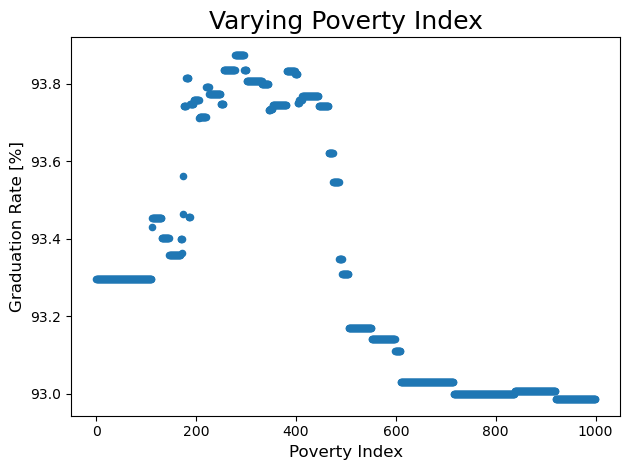

In [35]:
school = "San Gabriel High"
sample_school = features_matrix.loc[[school_agg_info.query(f"School == '{school}'").index[0]]]
test_values = np.arange(0, 1000, 1)
test_category = plotted_features["Feature"].iloc[n]
x_label = "Poverty Index"
test_schools = pd.DataFrame(data = np.repeat(sample_school.values, len(test_values), axis = 0), columns = sample_school.columns)
test_schools[test_category] = test_values

results = pd.DataFrame(data={test_category: test_values, "Graduation Rate": (rfrg1.predict(test_schools)+rfrg2.predict(test_schools))/2})
results.plot(x=test_category, y="Graduation Rate", kind = "scatter")
plt.xticks(fontsize=10)
plt.yticks(fontsize=10, rotation = 0)
plt.xlabel(x_label, fontdict={'size':12})
plt.ylabel("Graduation Rate [%]", fontdict={'size':12})
plt.title(f"Varying {x_label}", fontdict={'size':18})
#plt.text(200, 90.5, f"Modelled School: {school}", fontdict={'size':12})
plt.tight_layout()
#plt.savefig(f"Graduation_{test_category}_{school}.png")

#### College Feature Importance

In [155]:
college_feature_importance = pd.DataFrame(data={"Feature": rfr1.feature_names_in_, 
                                      "Score": (rfr1.feature_importances_+rfr2.feature_importances_)/2
                                     }
                               )
college_feature_importance["NormalizedScore"] = college_feature_importance["Score"]/college_feature_importance["Score"].max()
college_feature_importance.to_pickle("college_feature_importance.pkl")

In [171]:
college_feature_importance.sort_values("NormalizedScore",ascending=False);

In [194]:
sample_school.columns

Index(['Magnet', 'Charter', 'NumStudents', 'PercentFemale', 'PercentAsian',
       'PercentAfricanAm', 'PercentFilipino', 'PercentHispanic',
       'PercentAmIndian', 'PercentPacificIslander', 'PercentTwo+Races',
       'PercentWhite', 'PercentDisabilities', 'PercentESL', 'PercentFoster',
       'PercentHomeless', 'PercentMigrant', 'PercentSED', 'AvgMathSize',
       'PercentMath-Small', 'PercentMath-Medium', 'PercentMath-Large',
       'Num_AP_CS', 'Num_AP_Eng', 'Num_AP_FineArts', 'Num_AP_Foreign',
       'Num_AP_Math', 'Num_AP_Science', 'Num_AP_Social', 'Num_AP_Total',
       'Percent_Students_AP', 'Poverty_Index', 'Poverty_Index_SE',
       'NumFreeReduced', 'Mid-Range_Salary', 'Principal_Salary',
       'Superintendent_Salary', 'Percent_Teacher_Salary',
       'Percent_Admin_Salary'],
      dtype='object')

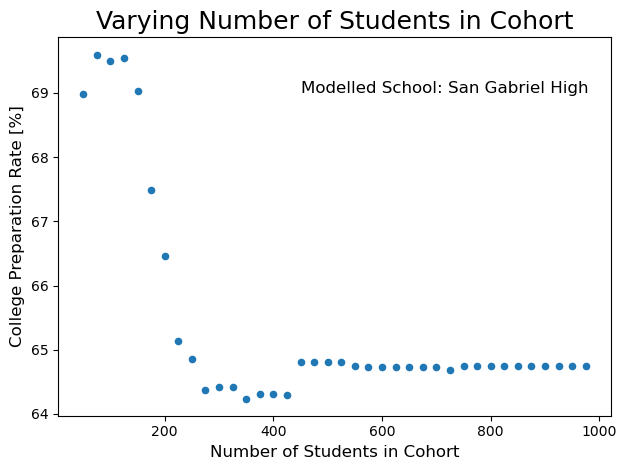

In [347]:
school = "San Gabriel High"
sample_school = features_matrix.loc[[school_agg_info.query(f"School == '{school}'").index[0]]]
test_values = np.arange(50, 1000, 25)
test_category = "NumStudents"
x_label = "Number of Students in Cohort"
test_schools = pd.DataFrame(data = np.repeat(sample_school.values, len(test_values), axis = 0), columns = sample_school.columns)
test_schools[test_category] = test_values

results = pd.DataFrame(data={test_category: test_values, "College Rate": (rfr1.predict(test_schools)+rfr2.predict(test_schools))/2})
results.plot(x=test_category, y="College Rate", kind = "scatter")
plt.xticks(fontsize=10)
plt.yticks(fontsize=10, rotation = 0)
plt.xlabel(x_label, fontdict={'size':12})
plt.ylabel("College Preparation Rate [%]", fontdict={'size':12})
plt.title(f"Varying {x_label}", fontdict={'size':18})
plt.text(450, 69, f"Modelled School: {school}", fontdict={'size':12})
plt.tight_layout()
plt.savefig(f"College_{test_category}_{school}.png")

# Visualization Scripts


## Comparsion between LR and RF

In [10]:
lr_values = pd.read_pickle("combined_lr.pkl")
modelled_values = pd.read_pickle("combined_rf.pkl")
college_feature_importance = pd.read_pickle("college_feature_importance.pkl")
graduation_feature_importance = pd.read_pickle("graduation_feature_importance.pkl")

In [395]:
test_table = lr_values[["Residual College"]].merge(modelled_values[["Residual College"]], left_index=True, right_index=True)

In [410]:
# Number of each quadrant
print("Q1: {}".format(test_table[(test_table["Residual College_x"] > 0) & (test_table["Residual College_y"] > 0)].shape[0]))
print("Q2: {}".format(test_table[(test_table["Residual College_x"] < 0) & (test_table["Residual College_y"] > 0)].shape[0]))
print("Q3: {}".format(test_table[(test_table["Residual College_x"] < 0) & (test_table["Residual College_y"] < 0)].shape[0]))
print("Q4: {}".format(test_table[(test_table["Residual College_x"] > 0) & (test_table["Residual College_y"] < 0)].shape[0]))

Q1: 578
Q2: 137
Q3: 583
Q4: 142


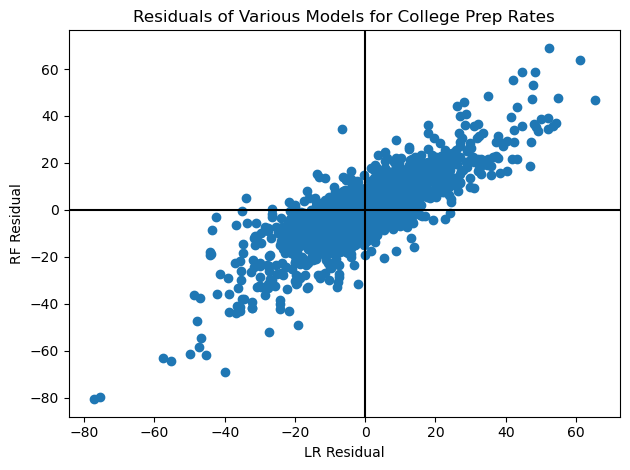

In [391]:
plt.scatter(lr_values["Residual College"], modelled_values["Residual College"])
plt.xlabel("LR Residual")
plt.ylabel("RF Residual")
plt.title("Residuals of Various Models for College Prep Rates")
plt.tight_layout()
plt.axhline(xmin=-90, xmax=90, color = 'k')
plt.axvline(ymin=-90, ymax=90, color = 'k')
plt.savefig("LR vs College Residuals.png");

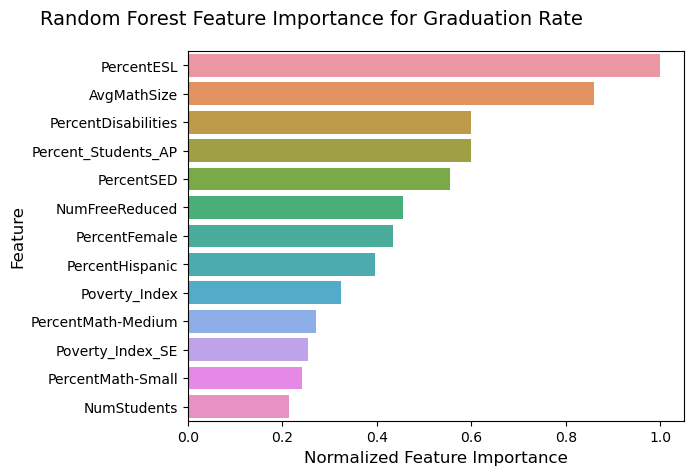

In [ ]:
plotted_features = graduation_feature_importance.query("NormalizedScore > 0.2").sort_values("NormalizedScore", ascending=False)
g = sns.barplot(data=plotted_features, x="NormalizedScore", y="Feature");
plt.xticks(fontsize=10)
plt.yticks(fontsize=10, rotation = 0)
plt.xlabel("Normalized Feature Importance", fontdict={'size':12})
plt.ylabel("Feature", fontdict={'size':12})
# col_labels = ["% AP Students", "Average Math Class Size", "Charter School", "% Medium Sized Math Classes", "% Small Sized Math Classes",
#               "Superintendent Salary", "% SED Students", "Number Students", "Number Free/Reduced Lunches", "% Homeless Students"];
# plt.yticks(ticks=plt.yticks()[0], labels = col_labels)
plt.title("Random Forest Feature Importance for Graduation Rate", fontdict={'size':14}, x = 0.25, y=1.05);

## Plots scatter plot of actual vs predicted graduation rates with 1 SD confidence intervals

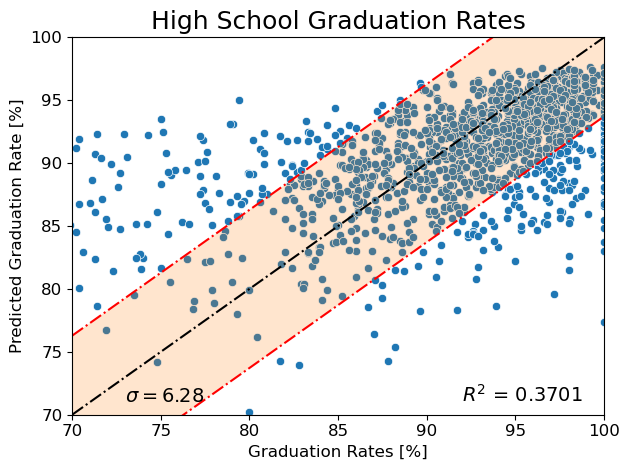

In [ ]:
sns.scatterplot(data=modelled_values, y="Predicted Graduation", x="Actual Graduation")
plt.xlabel("Graduation Rates [%]", fontdict={'size':12})
plt.ylabel("Predicted Graduation Rate [%]", fontdict={'size':12})
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
x_min = 70
x_max = 100
plt.xlim([x_min, x_max])
plt.ylim([x_min, x_max])
x = np.linspace(x_min, x_max)
sd = modelled_values["Residual Graduation"].std()
x_upper = x+1*sd
x_lower = x-1*sd
plt.plot(x, x, '-.', color = 'k')
plt.plot(x, x_upper, '-.', color = 'r')
plt.plot(x, x_lower, '-.', color = 'r')
plt.fill_between(x, x_lower, x_upper, alpha=0.2)
plt.title('High School Graduation Rates', fontdict={'size':18})
plt.text(92, 71, f'$R^2$ = {np.round(r2_score(modelled_values["Actual Graduation"], modelled_values["Predicted Graduation"]), 4)}', fontsize=14)
plt.text(73, 71, f'$\sigma = {np.round(sd,2)}$', fontsize=14)
plt.tight_layout()
plt.savefig("GraduationRates.png");

## Plots scatter plot of actual vs predicted college prep rates with 1 SD confidence intervals

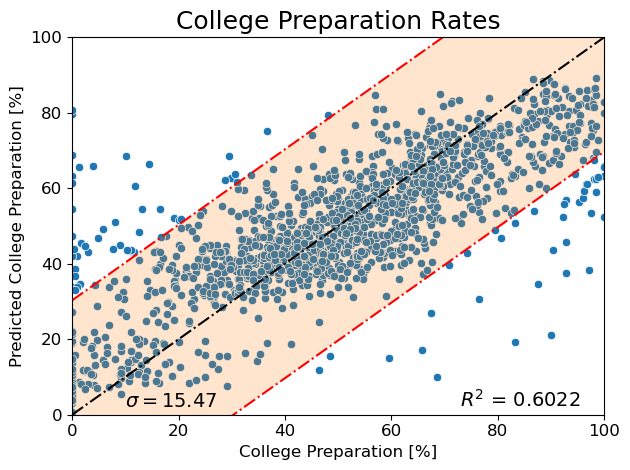

In [ ]:
sns.scatterplot(data=modelled_values, y="Predicted College", x="Actual College")
plt.xlabel("College Preparation [%]", fontdict={'size':12})
plt.ylabel("Predicted College Preparation [%]", fontdict={'size':12})
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
x_min = 0
x_max = 100
plt.xlim([x_min, x_max])
plt.ylim([x_min, x_max])
x = np.linspace(x_min, x_max)
sd = modelled_values["Residual College"].std()
x_upper = x+1.96*sd
x_lower = x-1.96*sd
plt.plot(x, x, '-.', color = 'k')
plt.plot(x, x_upper, '-.', color = 'r')
plt.plot(x, x_lower, '-.', color = 'r')
plt.fill_between(x, x_lower, x_upper, alpha=0.2)
plt.title('College Preparation Rates', fontdict={'size':18})
plt.text(73, 2, f'$R^2$ = {np.round(r2_score(modelled_values["Actual College"], modelled_values["Predicted College"]), 4)}', fontsize=14)
plt.text(10, 2, f'$\sigma = {np.round(sd,2)}$', fontsize=14)
plt.tight_layout()
plt.savefig("CollegePrep.png");

## Plots the top features towards graduation in order of magnitude 

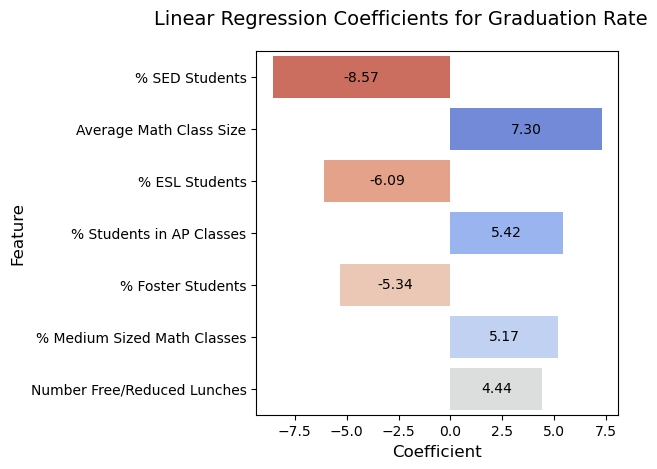

In [ ]:
plotted_features = graduation_feature_importance.query("`Abs Coefficient` > 3.5")
colors = [{p<0: 'red', p>=0: 'blue'}[True] for p in plotted_features["Coefficient"]]
g = sns.barplot(data=plotted_features, x="Coefficient", y="Feature", hue="Coefficient", palette='coolwarm_r', dodge=False)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10, rotation = 0)
plt.xlabel("Coefficient", fontdict={'size':12})
plt.ylabel("Feature", fontdict={'size':12})
plt.legend([],[], frameon=False)
col_labels = ["% SED Students", "Average Math Class Size", "% ESL Students", "% Students in AP Classes",
              "% Foster Students", "% Medium Sized Math Classes", "Number Free/Reduced Lunches"];
plt.yticks(ticks=plt.yticks()[0], labels = col_labels)
plt.title("Linear Regression Coefficients for Graduation Rate", fontdict={'size':14}, x = 0.4, y=1.05)
for bar in g.containers:
    plt.bar_label(bar, label_type='center', fmt='%.2f', color='black')
plt.tight_layout()
#plt.savefig("GradRateCoeff.png");

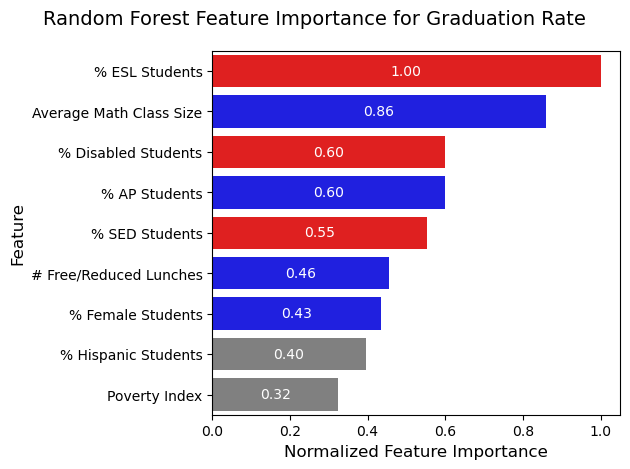

In [38]:
plotted_features = graduation_feature_importance.query("NormalizedScore > 0.3").sort_values("NormalizedScore", ascending=False)
plotted_features["Correlation"] = [-1, 1, -1, 1, -1, 1, 1, 0, 0]
g = sns.barplot(data=plotted_features, x="NormalizedScore", y="Feature", hue="Correlation", palette=["red", "gray", "blue"], dodge=False);
plt.xticks(fontsize=10)
plt.yticks(fontsize=10, rotation = 0)
plt.xlabel("Normalized Feature Importance", fontdict={'size':12})
plt.ylabel("Feature", fontdict={'size':12})
plt.legend([],[], frameon=False)
col_labels = ["% ESL Students", "Average Math Class Size", "% Disabled Students", "% AP Students", "% SED Students", 
              "# Free/Reduced Lunches", "% Female Students", "% Hispanic Students", "Poverty Index"];
plt.yticks(ticks=plt.yticks()[0], labels = col_labels)
plt.title("Random Forest Feature Importance for Graduation Rate", fontdict={'size':14}, x = 0.25, y=1.05)
pos_features = []
for bar in g.containers:
    plt.bar_label(bar, label_type='center', fmt='%.2f', color='white')
plt.tight_layout()
plt.savefig("Grad_Prep_Features.png");

## Plots the top features towards college prep in order of magnitude 

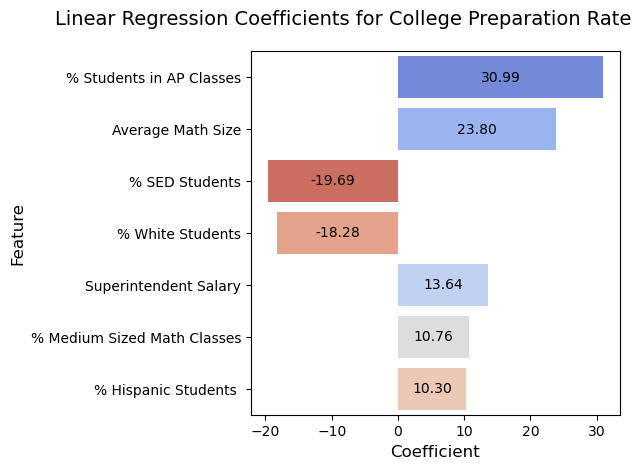

In [372]:
plotted_features = college_feature_importance.query("`Abs Coefficient` > 10")
colors = [{p<0: 'red', p>=0: 'blue'}[True] for p in plotted_features["Coefficient"]]
g = sns.barplot(data=plotted_features, x="Coefficient", y="Feature", hue="Coefficient", palette='coolwarm_r', dodge=False)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10, rotation = 0)
plt.xlabel("Coefficient", fontdict={'size':12})
plt.ylabel("Feature", fontdict={'size':12})
plt.legend([],[], frameon=False)
col_labels = ["% Students in AP Classes", "Average Math Size", "% SED Students", "% White Students", 
              "Superintendent Salary", "% Medium Sized Math Classes", "% Hispanic Students "];
plt.yticks(ticks=plt.yticks()[0], labels = col_labels)
plt.title("Linear Regression Coefficients for College Preparation Rate", fontdict={'size':14}, x = 0.25, y=1.05);
for bar in g.containers:
    plt.bar_label(bar, label_type='center', fmt='%.2f', color='black')
plt.tight_layout()
plt.savefig("CollegePrepCoeff.png");

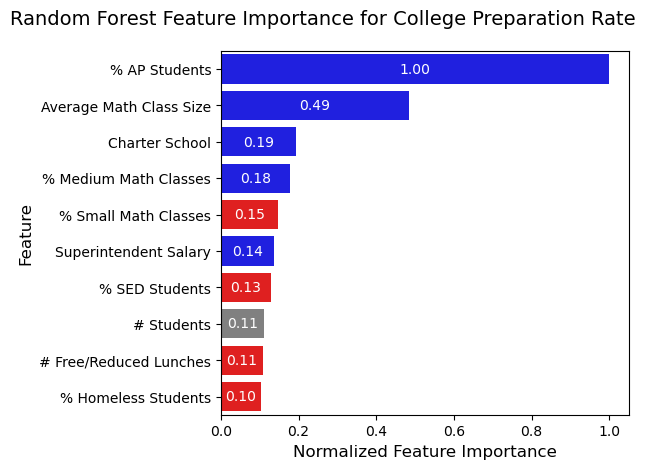

In [9]:
plotted_features = college_feature_importance.query("NormalizedScore > 0.1").sort_values("NormalizedScore", ascending=False)
plotted_features["Correlation"] = [1, 1, 1, 1, -1, 1, -1, 0, -1, -1]
g = sns.barplot(data=plotted_features, x="NormalizedScore", y="Feature", hue="Correlation", palette=["red", "gray", "blue"], dodge=False);
plt.xticks(fontsize=10)
plt.yticks(fontsize=10, rotation = 0)
plt.xlabel("Normalized Feature Importance", fontdict={'size':12})
plt.ylabel("Feature", fontdict={'size':12})
plt.legend([],[], frameon=False)
col_labels = ["% AP Students", "Average Math Class Size", "Charter School", "% Medium Math Classes", "% Small Math Classes",
              "Superintendent Salary", "% SED Students", "# Students", "# Free/Reduced Lunches", "% Homeless Students"];
plt.yticks(ticks=plt.yticks()[0], labels = col_labels)
plt.title("Random Forest Feature Importance for College Preparation Rate", fontdict={'size':14}, x = 0.25, y=1.05)
pos_features = []
for bar in g.containers:
    plt.bar_label(bar, label_type='center', fmt='%.2f', color='white')
plt.tight_layout()
plt.savefig("CollegePrepCoeff.png");

## Plotly implementation 
Plotly offers zoom on map, but is not as easy to concatenate figures and has no way to have selectors

In [45]:
import plotly.express as px
import plotly.graph_objects as go


url ="https://raw.githubusercontent.com/codeforgermany/click_that_hood/main/public/data/california-counties.geojson"
from urllib.request import urlopen
import json
with urlopen(url) as response:
    counties = json.load(response)

county_list = pd.DataFrame([entry['properties']['name'] for entry in counties['features']]).rename(columns={0:"County Name"})

county_list["Values"] = [1]*county_list.shape[0]

CA_map = px.choropleth(county_list, 
                        center= {'lat': 36.7783, 'lon': -119.4179},
                        scope='usa',
                        geojson=counties, 
                        locations="County Name",
                        featureidkey = "properties.name",
                        hover_data = {"County Name": False}, 
                        hover_name = "County Name")
CA_map.update_geos(fitbounds="locations", visible=False)
CA_map.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

school_map = px.scatter_geo(combined_lr, 
                            center= {'lat': 36.7783, 'lon': -119.4179},
                            scope='usa',
                            lat="Latitude", 
                            lon="Longitude",
                            opacity=.75,
                            hover_name="SchoolName",
                            hover_data={"Latitude": False, 
                                        "Longitude": False, 
                                        "CohortStudents": True,
                                        "Actual Graduation": True,
                                        "Predicted Graduation": ':0.1f',
                                        "Student-Weighted Residual Graduation": ':0.2f'},
                            labels = {"CohortStudents": "Num Students", 
                                      "Actual Graduation": "% Graduated",
                                      "Predicted Graduation": "% Predicted Graduated",
                                      "Student-Weighted Residual Graduation": "Num Students Error"})
school_map.update_geos(fitbounds="locations", visible=False)
school_map.update_traces(marker_color="Yellow")
school_map.update_layout(margin={"r":0,"t":0,"l":0,"b":0});                           

CA_map_overlay = go.Figure(CA_map)
CA_map_overlay.add_trace(school_map.data[0])

## Code in Testing

# Deprecated Visualization Scripts
Scripts have been pushed to CaliforniaHS.py

## Interactive visualization plotting map of CA with schools with tooltip for grad rates

In [23]:
import altair as alt

url = "https://raw.githubusercontent.com/deldersveld/topojson/080eb96a46307efd0c4a31f4c11ccabeee5e97dd/countries/us-states/CA-06-california-counties.json"
counties = alt.topo_feature(url, 'cb_2015_california_county_20m')
interval = alt.selection_multi()
scroll = alt.selection_interval(on="wheel[event.altKey]", bind='scales')

x_min=70
x_max=100
y_min=x_min
y_max=x_max

background = alt.Chart(counties).mark_geoshape(
                        fill='blue',
                        stroke='white'
                    ).properties(
                        width = 400, 
                        height = 500).project('albersUsa')
schools = alt.Chart(modelled_values).mark_point(
                size=80, 
                stroke="yellow", 
                fill="yellow", 
                strokeOpacity=1,
                fillOpacity=1,
                shape="diamond"
            ).encode(
                longitude="Longitude:Q",
                latitude="Latitude:Q",
                tooltip=[
                    alt.Tooltip("SchoolName:N", title="School Name"),
                    alt.Tooltip("CohortStudents:Q", title="# Students"), 
                    alt.Tooltip("Actual Graduation:Q", title="% Students Graduated", format='.3'),
                    alt.Tooltip("Predicted Graduation:Q", title="% Students Graduated Predicted", format='.3'),
                    alt.Tooltip("Student-Weighted Residual Graduation:Q", title="Δ Students Graduated", format='.3')]
            )

rate = alt.Chart(modelled_values).mark_circle(clip=True, color="blue"
                ).encode(
                    x=alt.X("Actual Graduation:Q", title = "Actual Graduation Rate [%]", scale=alt.Scale(domain=(x_min,x_max))),
                    y=alt.Y("Predicted Graduation:Q", title = "Predicted Graduation Rate [%]", scale=alt.Scale(domain=(y_min,y_max))),
                    color=alt.condition(interval, alt.value('blue'), alt.value('lightgray')),
                    #opacity=alt.condition(individual, alt.value(1.0), alt.value(0.05)),
                    tooltip=[
                        alt.Tooltip("SchoolName:N", title="School Name"),
                        alt.Tooltip("CohortStudents:Q", title="# Students"), 
                        alt.Tooltip("Actual Graduation:Q", title="% Students Graduated", format='.3'),
                        alt.Tooltip("Predicted Graduation:Q", title="% Students Graduated Predicted", format='.3')]
                ).properties(
                    width=500,
                    height=500
                ).add_selection(interval
                )

grad_sd = modelled_values["Residual Graduation"].std()
grad_score = r2_score(modelled_values["Actual Graduation"], modelled_values["Predicted Graduation"])

line_x_min = 0
line_x_max = 100
line_y_min = line_x_min
line_y_max = line_x_max
lines = pd.DataFrame({
    'Actual': [line_x_min,line_x_max],
    'Predicted':  [line_y_min,line_y_max],
    'Predicted_Upper':  [line_y_min+grad_sd, line_y_max+grad_sd],
    'Predicted_Lower':  [line_y_min-grad_sd, line_y_max-grad_sd],
    'Max': [line_y_max, line_y_max]
})


center_line = alt.Chart(lines).mark_line(clip=True, color="black", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted"
                )

lower_line = alt.Chart(lines).mark_line(clip=True, color="red", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted_Lower"
                )

upper_line = alt.Chart(lines).mark_line(clip=True, color="red", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted_Upper"
                )

shaded_area = alt.Chart(lines).mark_area(clip=True, opacity=0.2, color='orange'
                ).encode(
                    x="Actual", 
                    y="Predicted_Lower",
                    y2="Predicted_Upper"
                )
shaded_area_good = alt.Chart(lines).mark_area(clip=True, opacity=0.2, color='green'
                ).encode(
                    x="Actual", 
                    y="Predicted_Lower",
                )
shaded_area_bad = alt.Chart(lines).mark_area(clip=True, opacity=0.2, color='red'
                ).encode(
                    x="Actual", 
                    y="Max",
                    y2="Predicted_Upper"
                )

text = alt.Chart({'values':[{}]}).mark_text(
            align="right", baseline="top"
        ).encode(
            x=alt.value(475),  # pixels from left
            y=alt.value(450),  # pixels from top
            text=alt.value(
                    [f"σ = {grad_sd:.2f}", f"R = {grad_score:.4f}"]
                ),
            size=alt.value(16)
        )

geographic_panel = background+schools
scatter_panel = rate+center_line+upper_line+lower_line+shaded_area+shaded_area_good+text+shaded_area_bad

(geographic_panel|scatter_panel).configure_axis(
                                    labelFontSize=14,
                                    titleFontSize=16
                                ).configure_view(
                                    strokeWidth=0
                                )#.save("Interactive_Graduation.html")

alt.HConcatChart(...)

## Interactive visualization plotting map of CA with schools with tooltip for college prep rates

In [105]:
background = alt.Chart(counties).mark_geoshape(
                        fill='blue',
                        stroke='white',
                    ).encode(
                        tooltip="properties.NAME:N"
                    )
background

alt.Chart(...)

In [44]:
url

'https://raw.githubusercontent.com/deldersveld/topojson/080eb96a46307efd0c4a31f4c11ccabeee5e97dd/countries/us-states/CA-06-california-counties.json'

In [106]:
import altair as alt

url = "https://raw.githubusercontent.com/deldersveld/topojson/080eb96a46307efd0c4a31f4c11ccabeee5e97dd/countries/us-states/CA-06-california-counties.json"
counties = alt.topo_feature(url, 'cb_2015_california_county_20m')
individual = alt.selection_single()
x_min=0
x_max=100
y_min=x_min
y_max=x_max

plotted_df = modelled_values
background = alt.Chart(counties).mark_geoshape(
                        fill='blue',
                        stroke='white',
                    ).encode(
                        tooltip=alt.Tooltip("properties.NAME:N", title="County")
                    ).properties(
                        width = 400, 
                        height = 500).project('albersUsa')
schools = alt.Chart(plotted_df).mark_point(
                size=80, 
                stroke="yellow", 
                fill="yellow", 
                strokeOpacity=1,
                fillOpacity=1,
                shape="diamond"
            ).encode(
                longitude="Longitude:Q",
                latitude="Latitude:Q",
                tooltip=[
                    alt.Tooltip("SchoolName:N", title="School Name"),
                    alt.Tooltip("CohortStudents:Q", title="# Students"), 
                    alt.Tooltip("Actual College:Q", title="% College Prepared", format='.3'),
                    alt.Tooltip("Predicted College:Q", title="% College Prepared Predicted", format='.3'),
                    alt.Tooltip("Student-Weighted Residual College:Q", title="Δ College Prepared", format='.3')]
            )

rate = alt.Chart(plotted_df).mark_circle(clip=True, color="blue", size=40
                ).encode(
                    x=alt.X("Actual College:Q", title = "Actual College Rate [%]", scale=alt.Scale(domain=(x_min,x_max))),
                    y=alt.Y("Predicted College:Q", title = "Predicted College Rate [%]", scale=alt.Scale(domain=(y_min,y_max))),
                    color=alt.value('blue'),
                    #opacity=alt.condition(individual, alt.value(1.0), alt.value(0.05)),
                    tooltip=[
                        alt.Tooltip("SchoolName:N", title="School Name"),
                        alt.Tooltip("CohortStudents:Q", title="# Students"),
                        alt.Tooltip("Actual College:Q", title="% College Prepared", format='.3'),
                        alt.Tooltip("Predicted College:Q", title="% College Prepared Predicted", format='.3')]
                ).properties(
                    width=500,
                    height=500
                )
rate_all = alt.Chart(modelled_values).mark_circle(clip=True, color="blue"
                ).encode(
                    x=alt.X("Actual College:Q", title = "Actual College Rate [%]", scale=alt.Scale(domain=(x_min,x_max))),
                    y=alt.Y("Predicted College:Q", title = "Predicted College Rate [%]", scale=alt.Scale(domain=(y_min,y_max))),
                    color=alt.value('lightgray'),
                    #tooltip=[
                    #    alt.Tooltip("SchoolName:N", title="School Name"),
                    #    alt.Tooltip("CohortStudents:Q", title="# Students"),
                    #    alt.Tooltip("Actual College:Q", title="% College Prepared", format='.3'),
                    #    alt.Tooltip("Predicted College:Q", title="% College Prepared Predicted", format='.3')]
                ).properties(
                    width=500,
                    height=500
                )

sd = plotted_df["Residual College"].std()
score = r2_score(plotted_df["Actual College"], plotted_df["Predicted College"])

lines = pd.DataFrame({
    'Actual': [x_min,x_max],
    'Predicted':  [y_min,y_max],
    'Predicted_Upper':  [y_min+sd, y_max+sd],
    'Predicted_Lower':  [y_min-sd, y_max-sd]
})


center_line = alt.Chart(lines).mark_line(clip=True, color="black", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted"
                )

lower_line = alt.Chart(lines).mark_line(clip=True, color="red", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted_Lower"
                )

upper_line = alt.Chart(lines).mark_line(clip=True, color="red", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted_Upper"
                )

shaded_area = alt.Chart(lines).mark_area(clip=True, opacity=0.2, color='orange'
                ).encode(
                    x="Actual", 
                    y="Predicted_Lower",
                    y2="Predicted_Upper"
                )

text = alt.Chart({'values':[{}]}).mark_text(
            align="right", baseline="top"
        ).encode(
            x=alt.value(475),  # pixels from left
            y=alt.value(450),  # pixels from top
            text=alt.value(
                    [f"σ = {sd:.2f}", f"R = {score:.4f}"]
                ),
            size=alt.value(16)
                )

geographic_panel = background+schools
scatter_panel = shaded_area+text+rate_all+rate+center_line+upper_line+lower_line

(geographic_panel|scatter_panel).configure_axis(
                                    labelFontSize=14,
                                    titleFontSize=16
                                ).configure_view(
                                    strokeWidth=0
                                )

alt.HConcatChart(...)

In [501]:
import altair as alt

url = "https://raw.githubusercontent.com/deldersveld/topojson/080eb96a46307efd0c4a31f4c11ccabeee5e97dd/countries/us-states/CA-06-california-counties.json"
counties = alt.topo_feature(url, 'cb_2015_california_county_20m')
individual = alt.selection_single()
x_min=0
x_max=100
y_min=x_min
y_max=x_max

plotted_df = modelled_values
background = alt.Chart(counties).mark_geoshape(
                        fill='blue',
                        stroke='white'
                    ).properties(
                        width = 400, 
                        height = 500).project('albersUsa')
schools = alt.Chart(plotted_df).mark_point(
                size=80, 
                stroke="yellow", 
                fill="yellow", 
                strokeOpacity=1,
                fillOpacity=1,
                shape="diamond"
            ).encode(
                longitude="Longitude:Q",
                latitude="Latitude:Q",
                tooltip=[
                    alt.Tooltip("SchoolName:N", title="School Name"),
                    alt.Tooltip("CohortStudents:Q", title="# Students"), 
                    alt.Tooltip("Actual College:Q", title="% College Prepared", format='.3'),
                    alt.Tooltip("Predicted College:Q", title="% College Prepared Predicted", format='.3'),
                    alt.Tooltip("Student-Weighted Residual College:Q", title="Δ College Prepared", format='.3')]
            )

rate = alt.Chart(plotted_df).mark_circle(clip=True, color="blue", size=40
                ).encode(
                    x=alt.X("Actual College:Q", title = "Actual College Rate [%]", scale=alt.Scale(domain=(x_min,x_max))),
                    y=alt.Y("Predicted College:Q", title = "Predicted College Rate [%]", scale=alt.Scale(domain=(y_min,y_max))),
                    color=alt.value('blue'),
                    #opacity=alt.condition(individual, alt.value(1.0), alt.value(0.05)),
                    tooltip=[
                        alt.Tooltip("SchoolName:N", title="School Name"),
                        alt.Tooltip("CohortStudents:Q", title="# Students"),
                        alt.Tooltip("Actual College:Q", title="% College Prepared", format='.3'),
                        alt.Tooltip("Predicted College:Q", title="% College Prepared Predicted", format='.3')]
                ).properties(
                    width=500,
                    height=500
                )

sd = combined_lr["Remodelled_valuesege"].std()
score = r2_score(combined_lr["Actuamodelled_values, combined_lr["Predimodelled_valuese"])

lines = pd.DataFrame({
    'Actual': [x_min,x_max],
    'Predicted':  [y_min,y_max],
    'Predicted_Upper':  [y_min+sd, y_max+sd],
    'Predicted_Lower':  [y_min-sd, y_max-sd]
})


center_line = alt.Chart(lines).mark_line(clip=True, color="black", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted"
                )

lower_line = alt.Chart(lines).mark_line(clip=True, color="red", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted_Lower"
                )

upper_line = alt.Chart(lines).mark_line(clip=True, color="red", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted_Upper"
                )

shaded_area = alt.Chart(lines).mark_area(clip=True, opacity=0.2, color='orange'
                ).encode(
                    x="Actual", 
                    y="Predicted_Lower",
                    y2="Predicted_Upper"
                )

text = alt.Chart({'values':[{}]}).mark_text(
            align="right", baseline="top"
        ).encode(
            x=alt.value(475),  # pixels from left
            y=alt.value(450),  # pixels from top
            text=alt.value(
                    [f"σ = {sd:.2f}", f"R = {score:.4f}"]
                ),
            size=alt.value(16)
                )

geographic_panel = background+schools
scatter_panel = shaded_area+text+rate_all+rate+center_line+upper_line+lower_line

(geographic_panel|scatter_panel).configure_axis(
                                    labelFontSize=14,
                                    titleFontSize=16
                                ).configure_view(
                                    strokeWidth=0
                                )

alt.HConcatChart(...)

## Plots nearest neighbors

In [502]:
name = "Rise Kohyang High"
num_neighbors = 5

In [503]:
look_up = school_agg_info.query(f"School == '{name}'")[["School", "County", "StatusType"]]
if look_up.shape[0] == 1: 
    code = look_up.index[0]
elif look_up.shape[0] == 0:
    raise Exception(f"'{name}' is not a valid school name. Please check for typos and try again.")
elif look_up.shape[0] > 1: 
    print("There are multiple school entries with that name. Please select the school from the listed values by inputting the index.")
    print(look_up.reset_index())
    val = input()
    code = look_up.index[int(val)]

results = pd.merge(combined_lr.loc[school_neighbors.loc[code]["NN_CDSCode"]], 
             school_agg_features, 
             how="left", 
             left_index=True, 
             right_index=True).round(2).head(num_neighbors+1)
base = results.columns[0:1].append(results.columns[12:15])
predictions = base.append(results.columns[4:12])
school_demographics = base.append(results.columns[15:32])
school_stats = base.append(results.columns[32:])
school_profiles = base.append(results.columns[15:])
all_info = base.append(results.columns[4:12]).append(results.columns[15:])
results

,SchoolName,CohortStudents,Latitude,Longitude,Actual Graduation,Predicted Graduation,Residual Graduation,Student-Weighted Residual Graduation,Actual College,Predicted College,Residual College,Student-Weighted Residual College,Predicted College RF,Residual College RF,Student-Weighted Residual College RF,Magnet,Charter,NumStudents,PercentFemale,PercentMale,PercentAsian,PercentAfricanAm,PercentNotReported,PercentFilipino,PercentHispanic,PercentAmIndian,PercentPacificIslander,PercentTwo+Races,PercentWhite,PercentDisabilities,PercentESL,PercentFoster,PercentHomeless,PercentMigrant,PercentSED,AvgEnglishSize,PercentEnglish-Small,PercentEnglish-Medium,PercentEnglish-Large,AvgMathSize,PercentMath-Small,PercentMath-Medium,PercentMath-Large,AvgScienceSize,PercentScience-Small,PercentScience-Medium,PercentScience-Large,AvgSocialSize,PercentSocial-Small,PercentSocial-Medium,PercentSocial-Large,Num_AP_CS,Num_AP_Eng,Num_AP_FineArts,Num_AP_Foreign,Num_AP_Math,Num_AP_Science,Num_AP_Social,Num_AP_Total,Percent_Students_AP,Poverty_Index,Poverty_Index_SE,NumFreeMeals,PercentFreeMeals,NumFreeReduced,PercentFreeReduced,Beginning_ Salary,Mid-Range_Salary,Highest_Salary,Principal_Salary,Superintendent_Salary,Percent_Teacher_Salary,Percent_Admin_Salary
CDSCode,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
19647330133868,Rise Kohyang High,99,34.062428,-118.28217,98.0,89.98,8.02,7.94,0.00,75.38,-75.38,-74.63,78.12,-78.12,-77.34,0,1,99,45.45,54.55,46.46,0.0,0.0,0.0,42.42,0.0,0.0,0.0,0.00,14.14,16.16,0.0,0.0,0.0,93.94,27.0,17.65,70.59,11.76,29.0,7.14,57.14,35.71,22.0,47.37,52.63,0.00,25.0,27.78,55.56,16.67,0,2,3,2,1,3,5,16,30.0,138.0,58.0,319,73.00,388,88.79,46587.0,74412.0,92389.0,137581.0,350000.0,28.0,5.0
19647330111658,Alliance Marc & Eva Stern Math and Science,142,34.062039,-118.17365,94.4,92.13,2.27,3.22,90.85,82.09,8.75,12.43,81.36,9.49,13.47,0,1,142,47.18,52.82,0.00,0.0,0.0,0.0,95.77,0.0,0.0,0.0,0.00,12.68,8.45,0.0,0.0,0.0,95.07,25.0,31.03,51.72,17.24,24.0,37.93,48.28,13.79,32.0,0.00,52.63,47.37,29.0,22.22,33.33,44.44,0,4,1,5,3,1,3,17,37.0,223.0,86.0,494,82.20,544,90.52,46587.0,74412.0,92389.0,137581.0,350000.0,28.0,5.0
07617960101477,Leadership Public Schools: Richmond,152,37.934059,-122.36110,92.8,88.79,4.01,6.09,88.82,74.15,14.67,22.30,68.96,19.86,30.18,0,1,152,50.00,50.00,0.00,0.0,0.0,0.0,95.39,0.0,0.0,0.0,0.00,17.11,34.21,0.0,0.0,0.0,97.37,25.0,26.67,73.33,0.00,26.0,15.79,78.95,5.26,20.0,61.54,38.46,0.00,27.0,16.67,50.00,33.33,0,6,1,3,2,3,2,17,37.4,194.0,43.0,368,61.33,440,73.33,49923.0,78321.0,101764.0,133464.0,265200.0,31.0,5.0
01612590114868,Oakland Charter High,121,37.785856,-122.21961,92.6,94.39,-1.79,-2.17,88.43,86.85,1.58,1.91,81.25,7.18,8.69,0,1,121,49.59,50.41,23.14,0.0,0.0,0.0,66.94,0.0,0.0,0.0,0.00,0.00,15.70,0.0,0.0,0.0,95.04,26.0,16.67,83.33,0.00,24.0,38.89,55.56,5.56,29.0,5.56,61.11,33.33,28.0,16.67,58.33,25.00,1,6,1,2,2,1,8,21,50.9,124.0,25.0,308,67.10,364,79.30,48926.0,67368.0,96755.0,139888.0,336169.0,29.0,8.0
19647330108928,Larchmont Charter,91,34.093570,-118.36188,95.6,97.27,-1.67,-1.52,86.81,85.49,1.33,1.21,83.08,3.73,3.40,0,1,91,45.05,54.95,24.18,0.0,0.0,0.0,45.05,0.0,0.0,0.0,23.08,14.29,0.00,0.0,0.0,0.0,71.43,23.0,34.38,62.50,3.12,24.0,23.33,76.67,0.00,27.0,8.00,84.00,8.00,25.0,22.58,74.19,3.23,0,5,1,2,3,1,6,18,43.2,395.0,150.0,563,35.61,658,41.62,46587.0,74412.0,92389.0,137581.0,350000.0,28.0,5.0
19647330102541,New Designs Charter,85,34.030857,-118.27494,94.1,89.50,4.60,3.91,94.12,72.16,21.96,18.66,73.15,20.97,17.82,0,1,85,50.59,49.41,0.00,0.0,0.0,0.0,82.35,0.0,0.0,0.0,0.00,12.94,20.00,0.0,0.0,0.0,100.00,25.0,25.00,71.88,3.12,25.0,21.21,72.73,6.06,26.0,11.11,85.19,3.70,25.0,20.00,76.00,4.00,0,1,0,2,1,1,1,6,29.7,136.0,26.0,533,61.19,533,61.19,46587.0,74412.0,92389.0,137581.0,350000.0,28.0,5.0


In [504]:
import altair as alt

url = "https://raw.githubusercontent.com/deldersveld/topojson/080eb96a46307efd0c4a31f4c11ccabeee5e97dd/countries/us-states/CA-06-california-counties.json"
counties = alt.topo_feature(url, 'cb_2015_california_county_20m')
individual = alt.selection_single()
x_min=0
x_max=100
y_min=x_min
y_max=x_max

plotted_df = results
background = alt.Chart(counties).mark_geoshape(
                        fill='blue',
                        stroke='white'
                    ).properties(
                        width = 400, 
                        height = 500).project('albersUsa')
schools = alt.Chart(plotted_df).mark_point(
                size=80, 
                stroke="yellow", 
                fill="yellow", 
                strokeOpacity=1,
                fillOpacity=1,
                shape="diamond"
            ).encode(
                longitude="Longitude:Q",
                latitude="Latitude:Q",
                tooltip=[
                    alt.Tooltip("SchoolName:N", title="School Name"),
                    alt.Tooltip("CohortStudents:Q", title="# Students"), 
                    alt.Tooltip("Actual College:Q", title="% College Prepared", format='.3'),
                    alt.Tooltip("Predicted College:Q", title="% College Prepared Predicted", format='.3'),
                    alt.Tooltip("Student-Weighted Residual College:Q", title="Δ College Prepared", format='.3')]
            )

rate = alt.Chart(plotted_df).mark_circle(clip=True, color="blue", size=40
                ).encode(
                    x=alt.X("Actual College:Q", title = "Actual College Rate [%]", scale=alt.Scale(domain=(x_min,x_max))),
                    y=alt.Y("Predicted College:Q", title = "Predicted College Rate [%]", scale=alt.Scale(domain=(y_min,y_max))),
                    color=alt.value('blue'),
                    #opacity=alt.condition(individual, alt.value(1.0), alt.value(0.05)),
                    tooltip=[
                        alt.Tooltip("SchoolName:N", title="School Name"),
                        alt.Tooltip("CohortStudents:Q", title="# Students"),
                        alt.Tooltip("Actual College:Q", title="% College Prepared", format='.3'),
                        alt.Tooltip("Predicted College:Q", title="% College Prepared Predicted", format='.3')]
                ).properties(
                    width=500,
                    height=500
                )
rate_all = alt.Chart(combined_lr).mark_circle(clip=True, color="blue"
                ).encode(
                    x=alt.X("Actual College:Q", title = "Actual College Rate [%]", scale=alt.Scale(domain=(x_min,x_max))),
                    y=alt.Y("Predicted College:Q", title = "Predicted College Rate [%]", scale=alt.Scale(domain=(y_min,y_max))),
                    color=alt.value('lightgray'),
                    #tooltip=[
                    #    alt.Tooltip("SchoolName:N", title="School Name"),
                    #    alt.Tooltip("CohortStudents:Q", title="# Students"),
                    #    alt.Tooltip("Actual College:Q", title="% College Prepared", format='.3'),
                    #    alt.Tooltip("Predicted College:Q", title="% College Prepared Predicted", format='.3')]
                ).properties(
                    width=500,
                    height=500
                )

sd = combined_lr["Residual College"].std()
score = r2_score(combined_lr["Actual College"], combined_lr["Predicted College"])

lines = pd.DataFrame({
    'Actual': [x_min,x_max],
    'Predicted':  [y_min,y_max],
    'Predicted_Upper':  [y_min+sd, y_max+sd],
    'Predicted_Lower':  [y_min-sd, y_max-sd]
})


center_line = alt.Chart(lines).mark_line(clip=True, color="black", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted"
                )

lower_line = alt.Chart(lines).mark_line(clip=True, color="red", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted_Lower"
                )

upper_line = alt.Chart(lines).mark_line(clip=True, color="red", strokeDash=[9, 3, 9]
                ).encode(
                    x="Actual", 
                    y="Predicted_Upper"
                )

shaded_area = alt.Chart(lines).mark_area(clip=True, opacity=0.2, color='orange'
                ).encode(
                    x="Actual", 
                    y="Predicted_Lower",
                    y2="Predicted_Upper"
                )

text = alt.Chart({'values':[{}]}).mark_text(
            align="right", baseline="top"
        ).encode(
            x=alt.value(475),  # pixels from left
            y=alt.value(450),  # pixels from top
            text=alt.value(
                    [f"σ = {sd:.2f}", f"R = {score:.4f}"]
                ),
            size=alt.value(16)
                )

geographic_panel = background+schools
scatter_panel = shaded_area+text+rate_all+rate+center_line+upper_line+lower_line

(geographic_panel|scatter_panel).configure_axis(
                                    labelFontSize=14,
                                    titleFontSize=16
                                ).configure_view(
                                    strokeWidth=0
                                )

alt.HConcatChart(...)